# Two-zone evaluation notebook (strict temporal pairing)

This notebook is a cleaned and test-oriented evaluation pipeline built from the previous workflow.

It enforces:
- Only zone_2_betterave and zone_3_betterave.
- For each reference image: compare with at most 2 SR images (closest before + closest after).
- Drop all references from month 7.
- Drop the last reference in September and any reference on 28-11.
- Verify geometric and radiometric alignment per comparison.
- Save metrics and aligned LR/SR/REF images as GeoTIFF for each comparison.
- Save horizontal visualization with a random middle patch and a tiny LR-vs-SR detail patch.
- Plot final metrics of all comparisons.

In [2]:
import re
import hashlib
from pathlib import Path
from datetime import datetime

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from rasterio.mask import mask as rio_mask
from rasterio.warp import Resampling, reproject
from scipy.interpolate import interp1d
from skimage.transform import resize as sk_resize
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity as ssim_fn
import torch
from lpips import LPIPS

LPIPS_MODEL = LPIPS(net='alex').eval()

repo_root = Path.cwd().resolve()
if not (repo_root / 'src').exists():
    repo_root = repo_root.parent

GLOBAL_PS_DIR = repo_root / 'data' / 'beetsat_psscene_analytic_sr_udm2' / 'PSScene'
S2_DATES_FILE = repo_root / 'data' / 'Sentinel2_T31UEQ_interpolation_dates.txt'
S2_STACK_PATH = Path('C:/Users/ahtrabelsi/Desktop/stage/S2 data/Sentinel2_T31UEQ_TSG.tif')

ACTIVE_ZONES = ['zone_2_betterave',
                'zone_3_betterave'
                ]
ZONE_PATHS = {
    'zone_2_betterave': repo_root / 'data' / 'zones' / 'zone_2_betterave.gpkg',
    'zone_3_betterave': repo_root / 'data' / 'zones' / 'zone_3_betterave.gpkg',
}

SR_ZONE_ROUTING = {
    'zone_2_betterave': {
        'sen2srlite': Path(r'C:/Users/ahtrabelsi/Downloads/patch_zone_2_betterave_001_sen2srlite (1)/sr'),
        'sen2sr': Path(r'C:/Users/ahtrabelsi/Downloads/patch_zone_2_betterave_001_sen2sr/sr'),
        'ldsr': Path(r'C:/Users/ahtrabelsi/Downloads/patch_zone_2_betterave_001_ldsr/sr'),
    },
    'zone_3_betterave': {
        'sen2srlite': Path(r'D:\results\patch_zone_3_betterave_002_sen2srlite (1)\sr'),
        'sen2sr': Path(r'D:\results\patch_zone_3_betterave_002_sen2sr (1)\sr'),
        'ldsr': Path(r'D:\results\patch_zone_3_betterave_002_ldsr\sr'),
    },
}

S2_TO_PS_IDX = {
    'sen2srlite': [0, 1, 2, 7],
    'sen2sr': [0, 1, 2, 7],
    'ldsr': [0, 1, 2, 3],
}

COVERAGE_THRESHOLD = 0.90
PS_BANDS = [1, 2, 3, 4]
RGB_IDX = [2, 1, 0]
RNG = np.random.default_rng(20260806)

OUTPUT_ROOT = repo_root / 'outputs' / 'evaluation_pairs_two_zones'
COMPARE_DIR = OUTPUT_ROOT / 'comparisons'
PLOTS_DIR = OUTPUT_ROOT / 'plots'
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
COMPARE_DIR.mkdir(parents=True, exist_ok=True)
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print('Output folder:', OUTPUT_ROOT)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth
Output folder: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones


In [3]:
DATE_RE = re.compile(r'(\d{4}-\d{2}-\d{2})|(\d{8})')

def parse_date_from_name(path: Path):
    m = DATE_RE.search(path.name)
    if not m:
        return None
    raw = m.group(1) if m.group(1) else m.group(2)
    try:
        return datetime.strptime(raw, '%Y-%m-%d' if '-' in raw else '%Y%m%d')
    except ValueError:
        return None

def find_ps_files(ps_dir: Path):
    out = []
    for p in Path(ps_dir).rglob('*.tif'):
        n = p.name.lower()
        if 'analyticms_sr' in n and 'udm' not in n and 'metadata' not in n and 'xml' not in n:
            out.append(p)
    return sorted(out)

def find_sr_files(sr_dir: Path):
    sr_dir = Path(sr_dir)
    if not sr_dir.exists():
        return []
    files = [p for p in sr_dir.rglob('*') if p.suffix.lower() in ('.tif', '.tiff')]
    return sorted(files)

def load_s2_dates(path: Path):
    dates = []
    with open(path, 'r', encoding='utf-8') as f:
        for line in f:
            line = line.strip()
            if line:
                dates.append(datetime.strptime(line, '%Y%m%d'))
    return dates

def inspect_date_frequency(dates: list[datetime]):
    if len(dates) < 2:
        print('Not enough dates to inspect frequency.')
        return
    diffs = pd.Series([(dates[i + 1] - dates[i]).days for i in range(len(dates) - 1)])
    print('Date frequency check from interpolation .txt file:')
    print('  count intervals:', len(diffs))
    print('  min / median / max days:', int(diffs.min()), float(diffs.median()), int(diffs.max()))
    print('  interval histogram (days -> count):')
    print(diffs.value_counts().sort_index())

S2_DATES = load_s2_dates(S2_DATES_FILE)
print('Loaded S2 dates:', len(S2_DATES))
inspect_date_frequency(S2_DATES)

Loaded S2 dates: 74
Date frequency check from interpolation .txt file:
  count intervals: 73
  min / median / max days: 5 5.0 5
  interval histogram (days -> count):
5    73
Name: count, dtype: int64


In [4]:
def clip_ps_to_zone(ps_path: Path, zone_gdf: gpd.GeoDataFrame):
    with rasterio.open(ps_path) as src:
        zgdf = zone_gdf
        if zgdf.crs is None:
            zgdf = zgdf.set_crs('EPSG:32631')
        zone_proj = zgdf.to_crs(src.crs)
        geoms = [g.__geo_interface__ for g in zone_proj.geometry]

        src_nodata = src.nodata if src.nodata is not None else 0
        try:
            arr, transform = rio_mask(
                src, geoms, crop=True, indexes=PS_BANDS, filled=True, nodata=src_nodata
            )
        except ValueError:
            return None, None

        arr = arr.astype(np.float32)
        arr[arr == src_nodata] = np.nan

        profile = src.profile.copy()
        profile.update(
            transform=transform,
            height=arr.shape[1],
            width=arr.shape[2],
            count=arr.shape[0],
            dtype='float32',
            nodata=np.nan,
        )
    return arr, profile

def coverage_fraction(arr: np.ndarray):
    valid = ~np.isnan(arr).any(axis=0)
    return float(valid.sum()) / float(valid.size)

def warp_array_to_profile(src_arr: np.ndarray, src_profile: dict, dst_profile: dict, resampling=Resampling.cubic):
    dst = np.full((src_arr.shape[0], dst_profile['height'], dst_profile['width']), np.nan, dtype=np.float32)
    for b in range(src_arr.shape[0]):
        reproject(
            source=src_arr[b],
            destination=dst[b],
            src_transform=src_profile['transform'],
            src_crs=src_profile['crs'],
            dst_transform=dst_profile['transform'],
            dst_crs=dst_profile['crs'],
            resampling=resampling,
            src_nodata=np.nan,
            dst_nodata=np.nan,
        )
    return dst

def warp_sr_to_ps(sr_path: Path, dst_profile: dict):
    with rasterio.open(sr_path) as src:
        n_bands = src.count
        src_nodata = src.nodata
        dst = np.full((n_bands, dst_profile['height'], dst_profile['width']), np.nan, dtype=np.float32)

        for b in range(1, n_bands + 1):
            # NumPy 2.5-safe read: no shape mutation from np.array(...) constructor.
            band = src.read(b, out_dtype='float32')
            if src_nodata is not None:
                band = np.where(band == src_nodata, np.nan, band)

            reproject(
                source=band,
                destination=dst[b - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=dst_profile['transform'],
                dst_crs=dst_profile['crs'],
                resampling=Resampling.bilinear,
                src_nodata=np.nan,
                dst_nodata=np.nan,
            )
    return dst

def align_arrays_center_crop(arr1: np.ndarray, arr2: np.ndarray):
    h = min(arr1.shape[1], arr2.shape[1])
    w = min(arr1.shape[2], arr2.shape[2])

    def crop(a):
        H, W = a.shape[1], a.shape[2]
        top = (H - h) // 2
        left = (W - w) // 2
        return a[:, top:top + h, left:left + w]

    return crop(arr1), crop(arr2)

def shared_valid_mask(arr1: np.ndarray, arr2: np.ndarray):
    return ~(np.isnan(arr1).any(axis=0) | np.isnan(arr2).any(axis=0))

def extract_lr_from_stack(stack_path: Path, zone_path: Path, target_date: datetime, model_name: str, dst_profile: dict):
    idx = int(np.argmin([abs((d - target_date).days) for d in S2_DATES]))
    matched_date = S2_DATES[idx]

    start = idx * 10 + 1
    stop = start + 10
    zone_gdf = gpd.read_file(zone_path)

    with rasterio.open(stack_path) as src:
        zone_proj = zone_gdf.to_crs(src.crs)
        geoms = [g.__geo_interface__ for g in zone_proj.geometry]
        src_nodata = src.nodata if src.nodata is not None else 0

        s2_img, transform = rio_mask(
            src, geoms, crop=True, indexes=range(start, stop), filled=True, nodata=src_nodata
        )

        s2_img = s2_img.astype(np.float32)
        s2_img[s2_img == src_nodata] = np.nan

        s2_profile = src.profile.copy()
        s2_profile.update(
            transform=transform,
            height=s2_img.shape[1],
            width=s2_img.shape[2],
            count=s2_img.shape[0],
            dtype='float32',
            nodata=np.nan,
        )

    lr_4 = s2_img[S2_TO_PS_IDX[model_name]]
    lr_warped = warp_array_to_profile(lr_4, s2_profile, dst_profile, resampling=Resampling.cubic)
    return lr_warped, matched_date

In [5]:
def to_rgb(arr: np.ndarray, rgb_idx=RGB_IDX, percentile=2.0):
    rgb = arr[rgb_idx]
    out = np.zeros((rgb.shape[1], rgb.shape[2], 3), dtype=np.float32)
    for i in range(3):
        band = rgb[i]
        lo = np.nanpercentile(band, percentile)
        hi = np.nanpercentile(band, 100 - percentile)
        out[..., i] = np.clip((band - lo) / (hi - lo + 1e-9), 0, 1)
    return out

def match_histograms_bandwise(src_arr: np.ndarray, ref_arr: np.ndarray):
    out = np.full_like(src_arr, np.nan, dtype=np.float32)
    for b in range(src_arr.shape[0]):
        src_b = src_arr[b]
        ref_b = ref_arr[b]

        src_valid = src_b[~np.isnan(src_b)].ravel()
        ref_valid = ref_b[~np.isnan(ref_b)].ravel()
        if src_valid.size < 100 or ref_valid.size < 100:
            out[b] = src_b
            continue

        src_sorted = np.sort(src_valid)
        ref_sorted = np.sort(ref_valid)
        n = min(len(src_sorted), len(ref_sorted))

        q = np.linspace(0, 1, n)
        src_q = np.interp(q, np.linspace(0, 1, len(src_sorted)), src_sorted)
        ref_q = np.interp(q, np.linspace(0, 1, len(ref_sorted)), ref_sorted)

        interp = interp1d(src_q, ref_q, bounds_error=False, fill_value=(ref_q[0], ref_q[-1]))
        corrected = src_b.copy()
        m = ~np.isnan(src_b)
        corrected[m] = interp(src_b[m])
        out[b] = corrected

    return out

def compute_sam(ps_arr: np.ndarray, sr_arr: np.ndarray, mask2d: np.ndarray):
    a = ps_arr[:, mask2d].T
    b = sr_arr[:, mask2d].T
    dot = np.sum(a * b, axis=1)
    norm = np.linalg.norm(a, axis=1) * np.linalg.norm(b, axis=1) + 1e-9
    return float(np.degrees(np.arccos(np.clip(dot / norm, -1, 1))).mean())


def compute_lpips(ps_arr: np.ndarray, sr_arr: np.ndarray, mask2d: np.ndarray):
    if mask2d.sum() < 100:
        return np.nan

    ps_rgb = np.zeros((3, ps_arr.shape[1], ps_arr.shape[2]), dtype=np.float32)
    sr_rgb = np.zeros((3, sr_arr.shape[1], sr_arr.shape[2]), dtype=np.float32)

    for b in range(3):
        ps_rgb[b] = ps_arr[b]
        sr_rgb[b] = sr_arr[b]

    ps_rgb = np.nan_to_num(ps_rgb, nan=0.0, posinf=0.0, neginf=0.0)
    sr_rgb = np.nan_to_num(sr_rgb, nan=0.0, posinf=0.0, neginf=0.0)

    ps_t = torch.from_numpy(ps_rgb[None].astype(np.float32))
    sr_t = torch.from_numpy(sr_rgb[None].astype(np.float32))
    with torch.no_grad():
        score = LPIPS_MODEL(ps_t, sr_t)
    return float(score.item())


def compute_metrics(ps_arr: np.ndarray, sr_arr: np.ndarray):
    mask2d = shared_valid_mask(ps_arr, sr_arr)
    if mask2d.sum() < 100:
        return {
            'valid_pixels': int(mask2d.sum()),
            'PSNR': np.nan,
            'SSIM': np.nan,
            'RMSE': np.nan,
            'SAM': np.nan,
            'LPIPS': np.nan,
        }

    ps_m = ps_arr[:, mask2d]
    sr_m = sr_arr[:, mask2d]

    lo = np.nanmin(ps_m)
    hi = np.nanmax(ps_m)
    ps_n = (ps_arr - lo) / (hi - lo + 1e-9)
    sr_n = (sr_arr - lo) / (hi - lo + 1e-9)

    psnr_vals = []
    ssim_vals = []
    for b in range(ps_arr.shape[0]):
        pb = ps_n[b].copy()
        sb = sr_n[b].copy()
        pb[~mask2d] = 0
        sb[~mask2d] = 0
        psnr_vals.append(psnr_fn(pb, sb, data_range=1.0))
        ssim_vals.append(ssim_fn(pb, sb, data_range=1.0))

    rmse = float(np.sqrt(np.mean((ps_m - sr_m) ** 2)))
    sam = compute_sam(ps_arr, sr_arr, mask2d)
    lpips = compute_lpips(ps_arr, sr_arr, mask2d)

    return {
        'valid_pixels': int(mask2d.sum()),
        'PSNR': float(np.mean(psnr_vals)),
        'SSIM': float(np.mean(ssim_vals)),
        'RMSE': rmse,
        'SAM': float(sam),
        'LPIPS': float(lpips),
    }

def verify_alignment(ps_arr: np.ndarray, sr_raw: np.ndarray, sr_eq: np.ndarray):
    m_raw = shared_valid_mask(ps_arr, sr_raw)
    m_eq = shared_valid_mask(ps_arr, sr_eq)

    valid_ratio = float(m_eq.sum()) / float(m_eq.size)
    shape_ok = bool(ps_arr.shape == sr_eq.shape)

    if m_raw.sum() < 100 or m_eq.sum() < 100:
        return {
            'geom_shape_ok': shape_ok,
            'geom_valid_ratio': valid_ratio,
            'rmse_before_rad_match': np.nan,
            'rmse_after_rad_match': np.nan,
            'radiometric_improved': False,
        }

    rmse_before = float(np.sqrt(np.mean((ps_arr[:, m_raw] - sr_raw[:, m_raw]) ** 2)))
    rmse_after = float(np.sqrt(np.mean((ps_arr[:, m_eq] - sr_eq[:, m_eq]) ** 2)))

    return {
        'geom_shape_ok': shape_ok,
        'geom_valid_ratio': valid_ratio,
        'rmse_before_rad_match': rmse_before,
        'rmse_after_rad_match': rmse_after,
        'radiometric_improved': bool(rmse_after <= rmse_before),
    }

In [6]:
def save_geotiff(path: Path, arr: np.ndarray, profile: dict):
    p = profile.copy()
    p.update(dtype='float32', count=arr.shape[0], nodata=np.nan, compress='lzw')
    path.parent.mkdir(parents=True, exist_ok=True)
    with rasterio.open(path, 'w', **p) as dst:
        dst.write(arr.astype(np.float32))

def seeded_random_patch(h: int, w: int, patch_h: int = 192, patch_w: int = 192, seed_text: str = ''):
    patch_h = min(patch_h, h)
    patch_w = min(patch_w, w)

    middle_top = max(0, h // 4)
    middle_bottom = max(middle_top + 1, (3 * h) // 4)
    middle_left = max(0, w // 4)
    middle_right = max(middle_left + 1, (3 * w) // 4)

    max_top = max(0, h - patch_h)
    max_left = max(0, w - patch_w)

    digest = hashlib.md5(seed_text.encode('utf-8')).hexdigest()
    seed = int(digest[:8], 16)
    rng = np.random.default_rng(seed)

    y0 = int(rng.integers(middle_top, middle_bottom))
    x0 = int(rng.integers(middle_left, middle_right))
    y0 = min(max(0, y0 - patch_h // 2), max_top)
    x0 = min(max(0, x0 - patch_w // 2), max_left)

    return y0, y0 + patch_h, x0, x0 + patch_w

def draw_horizontal_triplet(lr_arr: np.ndarray, sr_arr: np.ndarray, ref_arr: np.ndarray, save_path: Path, title: str):
    imgs = [to_rgb(lr_arr), to_rgb(sr_arr), to_rgb(ref_arr)]
    names = ['LR (from S2)', 'SR (matched)', 'Reference (PS)']

    fig, axes = plt.subplots(1, 3, figsize=(14, 4.8))
    for ax, im, name in zip(axes, imgs, names):
        ax.imshow(im)
        ax.set_title(name, fontsize=10)
        ax.axis('off')

    fig.suptitle(title, fontsize=12, fontweight='bold')
    plt.tight_layout()
    save_path.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(save_path, dpi=160, bbox_inches='tight')
    plt.close(fig)

def draw_triplet_with_patch(lr_arr: np.ndarray, sr_arr: np.ndarray, ref_arr: np.ndarray, save_path: Path, title: str, patch_bounds):
    y1, y2, x1, x2 = patch_bounds

    imgs = [to_rgb(lr_arr), to_rgb(sr_arr), to_rgb(ref_arr)]
    names = ['LR (from S2)', 'SR (matched)', 'Reference (PS)']

    fig, axes = plt.subplots(2, 3, figsize=(14, 8))

    for i, (im, name) in enumerate(zip(imgs, names)):
        axes[0, i].imshow(im)
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='yellow', linewidth=1.8)
        axes[0, i].add_patch(rect)
        axes[0, i].set_title(name, fontsize=10)
        axes[0, i].axis('off')

        patch = im[y1:y2, x1:x2]
        axes[1, i].imshow(patch)
        axes[1, i].set_title(f'Patch {name}', fontsize=10)
        axes[1, i].axis('off')

    fig.suptitle(title, fontsize=12, fontweight='bold')
    plt.tight_layout()
    save_path.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(save_path, dpi=160, bbox_inches='tight')
    plt.close(fig)

def draw_small_lr_sr_patch(lr_arr: np.ndarray, sr_arr: np.ndarray, save_path: Path, patch_bounds, tiny=48):
    y1, y2, x1, x2 = patch_bounds

    cy = (y1 + y2) // 2
    cx = (x1 + x2) // 2
    hh = tiny // 2

    lr_rgb = to_rgb(lr_arr)
    sr_rgb = to_rgb(sr_arr)

    y1s = max(0, cy - hh)
    y2s = min(lr_rgb.shape[0], cy + hh)
    x1s = max(0, cx - hh)
    x2s = min(lr_rgb.shape[1], cx + hh)

    lr_patch = lr_rgb[y1s:y2s, x1s:x2s]
    sr_patch = sr_rgb[y1s:y2s, x1s:x2s]
    diff = np.abs(sr_patch - lr_patch)

    fig, axes = plt.subplots(1, 3, figsize=(10, 3.6))
    axes[0].imshow(lr_patch)
    axes[0].set_title('Tiny LR patch')
    axes[0].axis('off')

    axes[1].imshow(sr_patch)
    axes[1].set_title('Tiny SR patch')
    axes[1].axis('off')

    axes[2].imshow(np.clip(diff * 3.0, 0, 1))
    axes[2].set_title('Abs diff (x3)')
    axes[2].axis('off')

    plt.tight_layout()
    save_path.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(save_path, dpi=180, bbox_inches='tight')
    plt.close(fig)

In [7]:
def screen_ps_scenes(zone_name: str, threshold: float = COVERAGE_THRESHOLD):
    zone_gdf = gpd.read_file(ZONE_PATHS[zone_name])
    ps_files = find_ps_files(GLOBAL_PS_DIR)

    passed = []
    for p in ps_files:
        d = parse_date_from_name(p)
        if d is None:
            continue

        arr, profile = clip_ps_to_zone(p, zone_gdf)
        if arr is None:
            continue

        cov = coverage_fraction(arr)
        if cov >= threshold:
            passed.append({
                'path': p,
                'date': d,
                'array': arr,
                'profile': profile,
                'coverage': cov,
            })

    passed.sort(key=lambda x: (-x['coverage'], x['date']))
    per_month = {}
    for item in passed:
        ym = (item['date'].year, item['date'].month)
        if ym not in per_month:
            per_month[ym] = item

    refs = sorted(per_month.values(), key=lambda x: x['date'])
    return refs

def filter_references(refs: list[dict]):
    refs = sorted(refs, key=lambda x: x['date'])

    # Remove month 7 references.
    refs = [r for r in refs if r['date'].month != 7]

    # Remove any reference on day-month 28-11.
    refs = [r for r in refs if not (r['date'].day == 28 and r['date'].month == 11)]

    # Remove the last September reference.
    sept_idx = [i for i, r in enumerate(refs) if r['date'].month == 9]
    if sept_idx:
        refs.pop(sept_idx[-1])

    return refs

def choose_before_after(ref_date: datetime, dated_sr_paths: list[tuple[Path, datetime]], max_delta_days: int = 3):
    before = []
    after = []
    for p, d in dated_sr_paths:
        delta = abs((d - ref_date).days)
        if delta > max_delta_days:
            continue
        if d < ref_date:
            before.append((p, d))
        elif d > ref_date:
            after.append((p, d))

    out = []
    if before:
        out.append(('before', min(before, key=lambda x: abs((x[1] - ref_date).days))))
    if after:
        out.append(('after', min(after, key=lambda x: abs((x[1] - ref_date).days))))
    return out

In [64]:
import cv2

def cv2_bicubic_resize_multiband(arr: np.ndarray, out_h: int, out_w: int) -> np.ndarray:
    """
    Resize a (C, H, W) array with cv2.INTER_CUBIC band-by-band.
    NaNs are preserved via a nearest-neighbor validity mask.
    """
    out = np.full((arr.shape[0], out_h, out_w), np.nan, dtype=np.float32)

    for b in range(arr.shape[0]):
        band = arr[b].astype(np.float32)
        valid_mask = np.isfinite(band)

        if valid_mask.sum() == 0:
            continue

        work = np.where(valid_mask, band, 0.0).astype(np.float32)

        band_up = cv2.resize(work, (out_w, out_h), interpolation=cv2.INTER_CUBIC)
        valid_up = cv2.resize(
            valid_mask.astype(np.uint8),
            (out_w, out_h),
            interpolation=cv2.INTER_NEAREST,
        ).astype(bool)

        band_up[~valid_up] = np.nan
        out[b] = band_up

    return out


all_rows = []
lr_cache = {}

MAX_DELTA_DAYS = 5
print(f"Matching policy: nearest before/after within {MAX_DELTA_DAYS} days (no month constraint).")

for zone_name in ACTIVE_ZONES:
    print("\n" + "=" * 72)
    print("ZONE:", zone_name)
    print("=" * 72)

    refs = screen_ps_scenes(zone_name)
    refs = filter_references(refs)
    print("References kept after filtering:", len(refs))

    for model_name, sr_dir in SR_ZONE_ROUTING[zone_name].items():
        sr_files = find_sr_files(sr_dir)
        dated_sr = [(p, parse_date_from_name(p)) for p in sr_files]
        dated_sr = [(p, d) for p, d in dated_sr if d is not None]

        print(f"  {model_name}: {len(dated_sr)} dated SR files")

        for ref in refs:
            ref_date = ref["date"]
            ref_arr = ref["array"]
            ref_profile = ref["profile"]

            selected = choose_before_after(ref_date, dated_sr, max_delta_days=MAX_DELTA_DAYS)
            if not selected:
                print(f"    {ref_date:%Y-%m-%d}: no SR within {MAX_DELTA_DAYS} days before/after")
                continue

            lr_key = (zone_name, model_name, ref_date.strftime("%Y%m%d"))
            if lr_key not in lr_cache:
                lr_cache[lr_key] = extract_lr_from_stack(
                    S2_STACK_PATH,
                    ZONE_PATHS[zone_name],
                    ref_date,
                    model_name,
                    ref_profile,
                )
            lr_arr, lr_date = lr_cache[lr_key]

            for rel_pos, (sr_path, sr_date) in selected:
                sr_warped = warp_sr_to_ps(sr_path, ref_profile)
                idx = S2_TO_PS_IDX[model_name]
                if sr_warped.shape[0] <= max(idx):
                    print("    Skipping SR with insufficient bands:", sr_path)
                    continue
                sr_arr = sr_warped[idx]

                # 1) Geometric alignment (REF vs SR), then align LR on the same reference frame
                ref_eval, sr_eval = align_arrays_center_crop(ref_arr, sr_arr)
                ref_eval, lr_geom = align_arrays_center_crop(ref_eval, lr_arr)

                # 2) Baseline interpolation with cv2 bicubic
                baseline_interp = cv2_bicubic_resize_multiband(
                    lr_geom,
                    out_h=ref_eval.shape[1],
                    out_w=ref_eval.shape[2],
                )

                # 3) Geometric safety alignment after interpolation
                ref_eval, baseline_geom = align_arrays_center_crop(ref_eval, baseline_interp)

                # 4) Radiometric alignment before comparison
                sr_eq = match_histograms_bandwise(sr_eval, ref_eval)
                baseline_eq = match_histograms_bandwise(baseline_geom, ref_eval)

                metrics = compute_metrics(ref_eval, sr_eq)
                baseline_metrics = compute_metrics(ref_eval, baseline_eq)
                checks = verify_alignment(ref_eval, sr_eval, sr_eq)

                comp_id = f"{zone_name}_{model_name}_{ref_date:%Y%m%d}_{rel_pos}_{sr_date:%Y%m%d}"
                comp_dir = COMPARE_DIR / comp_id
                comp_dir.mkdir(parents=True, exist_ok=True)

                ref_tif = comp_dir / "reference.tif"
                sr_tif = comp_dir / "sr_matched.tif"
                lr_tif = comp_dir / "lr.tif"
                baseline_tif = comp_dir / "interpolation_baseline.tif"

                local_profile = ref_profile.copy()
                local_profile.update(height=ref_eval.shape[1], width=ref_eval.shape[2], count=4)

                save_geotiff(ref_tif, ref_eval, local_profile)
                save_geotiff(sr_tif, sr_eq, local_profile)
                save_geotiff(lr_tif, lr_geom, local_profile)
                save_geotiff(baseline_tif, baseline_eq, local_profile)

                patch = seeded_random_patch(
                    ref_eval.shape[1],
                    ref_eval.shape[2],
                    patch_h=192,
                    patch_w=192,
                    seed_text=comp_id,
                )

                triplet_plot = comp_dir / "triplet_patch_view.png"
                tiny_plot = comp_dir / "tiny_lr_sr_patch.png"

                draw_triplet_with_patch(
                    lr_geom,
                    sr_eq,
                    ref_eval,
                    triplet_plot,
                    title=comp_id,
                    patch_bounds=patch,
                )
                draw_small_lr_sr_patch(lr_geom, sr_eq, tiny_plot, patch, tiny=48)

                row = {
                    "zone": zone_name,
                    "model": model_name,
                    "pair_position": rel_pos,
                    "reference_date": ref_date.date(),
                    "sr_date": sr_date.date(),
                    "lr_date": lr_date.date(),
                    "delta_days_sr_ref": abs((sr_date - ref_date).days),
                    "coverage": ref["coverage"],
                    **metrics,
                    **checks,
                    "baseline_valid_pixels": int(baseline_metrics["valid_pixels"]),
                    "baseline_PSNR": baseline_metrics["PSNR"],
                    "baseline_SSIM": baseline_metrics["SSIM"],
                    "baseline_RMSE": baseline_metrics["RMSE"],
                    "baseline_SAM": baseline_metrics["SAM"],
                    "baseline_LPIPS": baseline_metrics["LPIPS"],
                    "lr_tif": str(lr_tif),
                    "baseline_tif": str(baseline_tif),
                    "sr_tif": str(sr_tif),
                    "reference_tif": str(ref_tif),
                    "triplet_plot": str(triplet_plot),
                    "tiny_plot": str(tiny_plot),
                }
                all_rows.append(row)

                print(
                    f"    {ref_date:%Y-%m-%d} [{rel_pos}] -> {sr_date:%Y-%m-%d} "
                    f"(delta={row['delta_days_sr_ref']}d) | "
                    f"SR PSNR={row['PSNR']:.2f} SSIM={row['SSIM']:.4f} RMSE={row['RMSE']:.4f} "
                    f"SAM={row['SAM']:.2f} LPIPS={row['LPIPS']:.4f} | "
                    f"BASELINE PSNR={row['baseline_PSNR']:.2f} SSIM={row['baseline_SSIM']:.4f} "
                    f"RMSE={row['baseline_RMSE']:.4f} SAM={row['baseline_SAM']:.2f} LPIPS={row['baseline_LPIPS']:.4f}"
                )

results_df = pd.DataFrame(all_rows)
print("\nTotal comparisons:", len(results_df))
display(results_df.head(10))

Matching policy: nearest before/after within 5 days (no month constraint).

ZONE: zone_2_betterave
References kept after filtering: 6
  sen2srlite: 60 dated SR files
    2020-01-21: no SR within 5 days before/after


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-02-18 [before] -> 2020-02-15 (delta=3d) | SR PSNR=30.76 SSIM=0.8884 RMSE=184.1212 SAM=2.64 LPIPS=0.3655 | BASELINE PSNR=29.92 SSIM=0.8644 RMSE=188.2578 SAM=2.66 LPIPS=0.1204


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-02-18 [after] -> 2020-02-20 (delta=2d) | SR PSNR=30.52 SSIM=0.8861 RMSE=189.6033 SAM=2.69 LPIPS=0.3690 | BASELINE PSNR=29.92 SSIM=0.8644 RMSE=188.2578 SAM=2.66 LPIPS=0.1204


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-04-20 [before] -> 2020-04-15 (delta=5d) | SR PSNR=32.71 SSIM=0.9350 RMSE=159.3294 SAM=1.76 LPIPS=0.3490 | BASELINE PSNR=39.21 SSIM=0.9385 RMSE=81.3400 SAM=1.02 LPIPS=0.0763


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-04-20 [after] -> 2020-04-25 (delta=5d) | SR PSNR=32.79 SSIM=0.9111 RMSE=161.7313 SAM=2.22 LPIPS=0.3491 | BASELINE PSNR=39.21 SSIM=0.9385 RMSE=81.3400 SAM=1.02 LPIPS=0.0763


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-05-06 [before] -> 2020-05-05 (delta=1d) | SR PSNR=35.94 SSIM=0.9326 RMSE=138.2620 SAM=1.50 LPIPS=0.3377 | BASELINE PSNR=35.40 SSIM=0.9149 RMSE=121.6065 SAM=1.37 LPIPS=0.1024


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-05-06 [after] -> 2020-05-10 (delta=4d) | SR PSNR=36.07 SSIM=0.9327 RMSE=140.2527 SAM=1.57 LPIPS=0.3374 | BASELINE PSNR=35.40 SSIM=0.9149 RMSE=121.6065 SAM=1.37 LPIPS=0.1024


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-08-08 [before] -> 2020-08-03 (delta=5d) | SR PSNR=35.61 SSIM=0.9477 RMSE=117.6940 SAM=1.44 LPIPS=0.3278 | BASELINE PSNR=36.39 SSIM=0.9420 RMSE=87.3689 SAM=1.13 LPIPS=0.0632


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-08-08 [after] -> 2020-08-13 (delta=5d) | SR PSNR=30.06 SSIM=0.9312 RMSE=217.0106 SAM=1.74 LPIPS=0.3363 | BASELINE PSNR=36.39 SSIM=0.9420 RMSE=87.3689 SAM=1.13 LPIPS=0.0632


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-10-31 [before] -> 2020-10-27 (delta=4d) | SR PSNR=30.72 SSIM=0.8927 RMSE=263.3186 SAM=4.25 LPIPS=0.3852 | BASELINE PSNR=29.88 SSIM=0.8692 RMSE=240.4829 SAM=3.56 LPIPS=0.1357


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-10-31 [after] -> 2020-11-01 (delta=1d) | SR PSNR=30.75 SSIM=0.8943 RMSE=257.7601 SAM=4.01 LPIPS=0.3840 | BASELINE PSNR=29.88 SSIM=0.8692 RMSE=240.4829 SAM=3.56 LPIPS=0.1357
  sen2sr: 60 dated SR files
    2020-01-21: no SR within 5 days before/after


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-02-18 [before] -> 2020-02-15 (delta=3d) | SR PSNR=30.68 SSIM=0.8859 RMSE=190.2144 SAM=2.70 LPIPS=0.3703 | BASELINE PSNR=29.92 SSIM=0.8644 RMSE=188.2578 SAM=2.66 LPIPS=0.1204


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-02-18 [after] -> 2020-02-20 (delta=2d) | SR PSNR=30.45 SSIM=0.8836 RMSE=195.3301 SAM=2.74 LPIPS=0.3736 | BASELINE PSNR=29.92 SSIM=0.8644 RMSE=188.2578 SAM=2.66 LPIPS=0.1204


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-04-20 [before] -> 2020-04-15 (delta=5d) | SR PSNR=32.59 SSIM=0.9325 RMSE=164.7835 SAM=1.82 LPIPS=0.3519 | BASELINE PSNR=39.21 SSIM=0.9385 RMSE=81.3400 SAM=1.02 LPIPS=0.0763


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-04-20 [after] -> 2020-04-25 (delta=5d) | SR PSNR=32.61 SSIM=0.9070 RMSE=169.9386 SAM=2.26 LPIPS=0.3526 | BASELINE PSNR=39.21 SSIM=0.9385 RMSE=81.3400 SAM=1.02 LPIPS=0.0763


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-05-06 [before] -> 2020-05-05 (delta=1d) | SR PSNR=35.73 SSIM=0.9292 RMSE=147.1317 SAM=1.53 LPIPS=0.3387 | BASELINE PSNR=35.40 SSIM=0.9149 RMSE=121.6065 SAM=1.37 LPIPS=0.1024


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-05-06 [after] -> 2020-05-10 (delta=4d) | SR PSNR=35.90 SSIM=0.9294 RMSE=148.2057 SAM=1.59 LPIPS=0.3384 | BASELINE PSNR=35.40 SSIM=0.9149 RMSE=121.6065 SAM=1.37 LPIPS=0.1024


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-08-08 [before] -> 2020-08-03 (delta=5d) | SR PSNR=35.41 SSIM=0.9440 RMSE=123.4406 SAM=1.50 LPIPS=0.3320 | BASELINE PSNR=36.39 SSIM=0.9420 RMSE=87.3689 SAM=1.13 LPIPS=0.0632


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-08-08 [after] -> 2020-08-13 (delta=5d) | SR PSNR=30.00 SSIM=0.9274 RMSE=220.1355 SAM=1.80 LPIPS=0.3411 | BASELINE PSNR=36.39 SSIM=0.9420 RMSE=87.3689 SAM=1.13 LPIPS=0.0632


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-10-31 [before] -> 2020-10-27 (delta=4d) | SR PSNR=30.68 SSIM=0.8895 RMSE=267.6378 SAM=4.31 LPIPS=0.3942 | BASELINE PSNR=29.88 SSIM=0.8692 RMSE=240.4829 SAM=3.56 LPIPS=0.1357


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-10-31 [after] -> 2020-11-01 (delta=1d) | SR PSNR=30.70 SSIM=0.8909 RMSE=262.3887 SAM=4.07 LPIPS=0.3948 | BASELINE PSNR=29.88 SSIM=0.8692 RMSE=240.4829 SAM=3.56 LPIPS=0.1357
  ldsr: 60 dated SR files
    2020-01-21: no SR within 5 days before/after


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-02-18 [before] -> 2020-02-15 (delta=3d) | SR PSNR=30.75 SSIM=0.8830 RMSE=182.3464 SAM=2.58 LPIPS=0.3619 | BASELINE PSNR=27.99 SSIM=0.8325 RMSE=389.7714 SAM=5.50 LPIPS=0.1204


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-02-18 [after] -> 2020-02-20 (delta=2d) | SR PSNR=30.51 SSIM=0.8809 RMSE=188.3879 SAM=2.64 LPIPS=0.3652 | BASELINE PSNR=27.99 SSIM=0.8325 RMSE=389.7714 SAM=5.50 LPIPS=0.1204


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-04-20 [before] -> 2020-04-15 (delta=5d) | SR PSNR=32.65 SSIM=0.9309 RMSE=158.3703 SAM=1.74 LPIPS=0.3416 | BASELINE PSNR=35.36 SSIM=0.8827 RMSE=433.2138 SAM=4.83 LPIPS=0.0763


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-04-20 [after] -> 2020-04-25 (delta=5d) | SR PSNR=32.71 SSIM=0.9039 RMSE=158.6139 SAM=2.23 LPIPS=0.3457 | BASELINE PSNR=35.36 SSIM=0.8827 RMSE=433.2138 SAM=4.83 LPIPS=0.0763


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-05-06 [before] -> 2020-05-05 (delta=1d) | SR PSNR=35.81 SSIM=0.9285 RMSE=133.2567 SAM=1.48 LPIPS=0.3268 | BASELINE PSNR=32.50 SSIM=0.8728 RMSE=390.7500 SAM=3.46 LPIPS=0.1024


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-05-06 [after] -> 2020-05-10 (delta=4d) | SR PSNR=35.94 SSIM=0.9284 RMSE=135.6491 SAM=1.58 LPIPS=0.3255 | BASELINE PSNR=32.50 SSIM=0.8728 RMSE=390.7500 SAM=3.46 LPIPS=0.1024


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-08-08 [before] -> 2020-08-03 (delta=5d) | SR PSNR=35.31 SSIM=0.9375 RMSE=115.4222 SAM=1.45 LPIPS=0.3358 | BASELINE PSNR=32.69 SSIM=0.9069 RMSE=349.0083 SAM=4.18 LPIPS=0.0632


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-08-08 [after] -> 2020-08-13 (delta=5d) | SR PSNR=29.90 SSIM=0.9211 RMSE=218.9548 SAM=1.78 LPIPS=0.3439 | BASELINE PSNR=32.69 SSIM=0.9069 RMSE=349.0083 SAM=4.18 LPIPS=0.0632


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-10-31 [before] -> 2020-10-27 (delta=4d) | SR PSNR=30.70 SSIM=0.8911 RMSE=262.3668 SAM=4.19 LPIPS=0.3877 | BASELINE PSNR=28.67 SSIM=0.8329 RMSE=394.8492 SAM=6.40 LPIPS=0.1357


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_19160\3206087028.py:59: DeprecationWarning: Setting the shape on a

    2020-10-31 [after] -> 2020-11-01 (delta=1d) | SR PSNR=30.73 SSIM=0.8927 RMSE=256.9151 SAM=3.95 LPIPS=0.3887 | BASELINE PSNR=28.67 SSIM=0.8329 RMSE=394.8492 SAM=6.40 LPIPS=0.1357

ZONE: zone_3_betterave
References kept after filtering: 7
  sen2srlite: 0 dated SR files
    2020-01-21: no SR within 5 days before/after
    2020-02-18: no SR within 5 days before/after
    2020-04-20: no SR within 5 days before/after
    2020-05-06: no SR within 5 days before/after
    2020-06-25: no SR within 5 days before/after
    2020-08-08: no SR within 5 days before/after
    2020-10-31: no SR within 5 days before/after
  sen2sr: 0 dated SR files
    2020-01-21: no SR within 5 days before/after
    2020-02-18: no SR within 5 days before/after
    2020-04-20: no SR within 5 days before/after
    2020-05-06: no SR within 5 days before/after
    2020-06-25: no SR within 5 days before/after
    2020-08-08: no SR within 5 days before/after
    2020-10-31: no SR within 5 days before/after
  ldsr: 0 dated

,zone,model,pair_position,reference_date,sr_date,lr_date,delta_days_sr_ref,coverage,valid_pixels,PSNR,...,baseline_SSIM,baseline_RMSE,baseline_SAM,baseline_LPIPS,lr_tif,baseline_tif,sr_tif,reference_tif,triplet_plot,tiny_plot
0,zone_2_betterave,sen2srlite,before,2020-02-18,2020-02-15,2020-02-20,3,0.983046,569687,30.758948,...,0.864371,188.257797,2.660990,0.120415,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
1,zone_2_betterave,sen2srlite,after,2020-02-18,2020-02-20,2020-02-20,2,0.983046,569687,30.522204,...,0.864371,188.257797,2.660990,0.120415,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
2,zone_2_betterave,sen2srlite,before,2020-04-20,2020-04-15,2020-04-20,5,0.983046,569687,32.711996,...,0.938507,81.340042,1.016991,0.076256,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
3,zone_2_betterave,sen2srlite,after,2020-04-20,2020-04-25,2020-04-20,5,0.983046,569687,32.793079,...,0.938507,81.340042,1.016991,0.076256,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
4,zone_2_betterave,sen2srlite,before,2020-05-06,2020-05-05,2020-05-05,1,0.983046,569687,35.935005,...,0.914884,121.606453,1.368025,0.102396,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
5,zone_2_betterave,sen2srlite,after,2020-05-06,2020-05-10,2020-05-05,4,0.983046,569687,36.074316,...,0.914884,121.606453,1.368025,0.102396,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
6,zone_2_betterave,sen2srlite,before,2020-08-08,2020-08-03,2020-08-08,5,0.983046,569687,35.607519,...,0.942017,87.368927,1.134790,0.063201,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
7,zone_2_betterave,sen2srlite,after,2020-08-08,2020-08-13,2020-08-08,5,0.983046,569687,30.059813,...,0.942017,87.368927,1.134790,0.063201,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...
8,zone_2_betterave,sen2srlite,before,2020-10-31,2020-10-27,2020-11-01,4,0.983046,569687,30.718043,...,0.869229,240.482880,3.557659,0.135656,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\Desktop\stage\s2-super-res...,C:\Users\ahtrabelsi\De

In [65]:
if results_df.empty:
    raise ValueError('No comparisons were produced. Check file paths and date parsing.')

metrics_csv = OUTPUT_ROOT / 'comparison_metrics.csv'
results_df.to_csv(metrics_csv, index=False)
print('Saved metrics:', metrics_csv)

summary_cols = ['PSNR', 'SSIM', 'RMSE', 'SAM', 'LPIPS', 'delta_days_sr_ref', 'coverage', 'geom_valid_ratio']
summary = (
    results_df.groupby(['zone', 'model', 'pair_position'], as_index=False)[summary_cols]
    .mean()
    .sort_values(['zone', 'model', 'pair_position'])
)
display(summary.round(4))

baseline_summary = (
    results_df.drop_duplicates(['zone', 'reference_date'])
    .groupby(['zone'], as_index=False)[['baseline_PSNR', 'baseline_SSIM', 'baseline_RMSE', 'baseline_SAM', 'baseline_LPIPS']]
    .mean()
    .sort_values(['zone'])
)
baseline_csv = OUTPUT_ROOT / 'comparison_summary_baseline.csv'
baseline_summary.to_csv(baseline_csv, index=False)
display(baseline_summary.round(4))
print('Saved baseline summary:', baseline_csv)

summary_csv = OUTPUT_ROOT / 'comparison_summary.csv'
summary.to_csv(summary_csv, index=False)
print('Saved summary:', summary_csv)

Saved metrics: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\comparison_metrics.csv


,zone,model,pair_position,PSNR,SSIM,RMSE,SAM,LPIPS,delta_days_sr_ref,coverage,geom_valid_ratio
0,zone_2_betterave,ldsr,after,31.9590,0.9054,191.7042,2.4368,0.3538,3.4,0.983,0.7189
1,zone_2_betterave,ldsr,before,33.0425,0.9142,170.3525,2.2884,0.3508,3.6,0.983,0.7189
2,zone_2_betterave,sen2sr,after,31.9329,0.9077,199.1997,2.4912,0.3601,3.4,0.983,0.7189
3,zone_2_betterave,sen2sr,before,33.0188,0.9162,178.6416,2.3724,0.3574,3.6,0.983,0.7189
4,zone_2_betterave,sen2srlite,after,32.0392,0.9111,193.2716,2.4449,0.3551,3.4,0.983,0.7189
5,zone_2_betterave,sen2srlite,before,33.1463,0.9193,172.5451,2.3190,0.3530,3.6,0.983,0.7189


,zone,baseline_PSNR,baseline_SSIM,baseline_RMSE,baseline_SAM,baseline_LPIPS
0,zone_2_betterave,34.1606,0.9058,143.8112,1.9477,0.0996


Saved baseline summary: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\comparison_summary_baseline.csv
Saved summary: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\comparison_summary.csv


In [66]:
plot_metrics = ['PSNR', 'SSIM', 'RMSE', 'SAM', 'LPIPS']

# Best-pair selection rule per reference:
# maximize SSIM, then PSNR, then minimize RMSE/SAM/LPIPS and temporal gap.
sel_df = results_df.copy()
sel_df['reference_date'] = pd.to_datetime(sel_df['reference_date'])

best_rows = (
    sel_df.sort_values(
        by=['zone', 'model', 'reference_date', 'SSIM', 'PSNR', 'RMSE', 'SAM', 'LPIPS', 'delta_days_sr_ref'],
        ascending=[True, True, True, False, False, True, True, True, True],
    )
    .groupby(['zone', 'model', 'reference_date'], as_index=False)
    .head(1)
    .sort_values(['zone', 'model', 'reference_date'])
    .reset_index(drop=True)
)

# Baseline rows are stored on every comparison row, so keep one row per zone/date.
baseline_rows = (
    sel_df.sort_values(['zone', 'reference_date', 'model', 'pair_position'])
    .drop_duplicates(['zone', 'reference_date'])
    .sort_values(['zone', 'reference_date'])
    .reset_index(drop=True)
)

best_csv = OUTPUT_ROOT / 'comparison_best_pair_per_reference.csv'
best_rows.to_csv(best_csv, index=False)
print('Saved best-pair table:', best_csv)

for zone_name in sorted(best_rows['zone'].unique()):
    zdf = best_rows[best_rows['zone'] == zone_name].copy()
    bdf = baseline_rows[baseline_rows['zone'] == zone_name].copy()
    if zdf.empty:
        continue

    for metric in plot_metrics:
        fig, ax = plt.subplots(figsize=(10, 4.8))

        for model in sorted(zdf['model'].unique()):
            mdf = zdf[zdf['model'] == model].sort_values('reference_date')
            valid = mdf[metric].notna()
            if valid.sum() == 0:
                continue

            ax.plot(
                mdf.loc[valid, 'reference_date'],
                mdf.loc[valid, metric],
                marker='o',
                linewidth=1.8,
                label=model,
            )

        baseline_metric = f'baseline_{metric}'
        if baseline_metric in bdf.columns:
            valid = bdf[baseline_metric].notna()
            if valid.sum() > 0:
                ax.plot(
                    bdf.loc[valid, 'reference_date'],
                    bdf.loc[valid, baseline_metric],
                    marker='s',
                    linestyle='--',
                    linewidth=2.2,
                    color='black',
                    label='Interpolation directe',
                )

        ax.set_title(f'Evolution du {metric} ', fontweight='bold')
        ax.grid(alpha=0.3)
        ax.set_xlabel('date de référence')
        ax.set_ylabel(metric)
        ax.tick_params(axis='x', rotation=45)

        handles, labels = ax.get_legend_handles_labels()
        if handles:
            ax.legend(handles, labels, loc='best', frameon=False)

        plt.tight_layout()
        out_path = PLOTS_DIR / f'metrics_evolution_bestpair_{metric}.png'
        fig.savefig(out_path, dpi=160, bbox_inches='tight')
        plt.close(fig)
        print('Saved plot:', out_path)

print('\nRows kept for evolution:', len(best_rows))
display(best_rows[['zone', 'model', 'reference_date', 'pair_position', 'PSNR', 'SSIM', 'RMSE', 'SAM', 'LPIPS', 'baseline_PSNR', 'baseline_SSIM', 'baseline_RMSE', 'baseline_SAM', 'baseline_LPIPS', 'delta_days_sr_ref']].head(20))

Saved best-pair table: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\comparison_best_pair_per_reference.csv
Saved plot: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\plots\metrics_evolution_bestpair_PSNR.png
Saved plot: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\plots\metrics_evolution_bestpair_SSIM.png
Saved plot: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\plots\metrics_evolution_bestpair_RMSE.png
Saved plot: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\plots\metrics_evolution_bestpair_SAM.png
Saved plot: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\plots\metrics_evolution_bestpair_LPIPS.png

Rows kept for evolution: 15


,zone,model,reference_date,pair_position,PSNR,SSIM,RMSE,SAM,LPIPS,baseline_PSNR,baseline_SSIM,baseline_RMSE,baseline_SAM,baseline_LPIPS,delta_days_sr_ref
0,zone_2_betterave,ldsr,2020-02-18,before,30.747223,0.883022,182.346420,2.579505,0.361915,27.993290,0.832543,389.771393,5.504133,0.120415,3
1,zone_2_betterave,ldsr,2020-04-20,before,32.645722,0.930922,158.370270,1.741840,0.341563,35.359387,0.882698,433.213776,4.828533,0.076256,5
2,zone_2_betterave,ldsr,2020-05-06,before,35.812330,0.928522,133.256699,1.479654,0.326816,32.499768,0.872846,390.749969,3.456965,0.102396,1
3,zone_2_betterave,ldsr,2020-08-08,before,35.308687,0.937472,115.422211,1.452527,0.335813,32.691790,0.906903,349.008331,4.183611,0.063201,5
4,zone_2_betterave,ldsr,2020-10-31,after,30.733440,0.892688,256.915131,3.948266,0.388678,28.668181,0.832924,394.849213,6.401160,0.135656,1
5,zone_2_betterave,sen2sr,2020-02-18,before,30.676808,0.885899,190.214401,2.700909,0.370272,29.921949,0.864371,188.257797,2.660990,0.120415,3
6,zone_2_betterave,sen2sr,2020-04-20,before,32.590507,0.932455,164.783493,1.819806,0.351915,39.208811,0.938507,81.340042,1.016991,0.076256,5
7,zone_2_betterave,sen2sr,2020-05-06,after,35.904288,0.929391,148.205719,1.592373,0.338381,35.400495,0.914884,121.606453,1.368025,0.102396,4
8,zone_2_betterave,sen2sr,2020-08-08,before,35.414702,0.943950,123.440605,1.495757,0.332040,36.388425,0.942017,87.368927,1.134790,0.063201,5
9,zone_2_betterave,sen2sr,2020-10-31,after,30.702759,0.890859,262.388733,4.068462,0.394843,29.883085,0.869229,240.482880,3.557659,0.135656,1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0053611207..1.0199895].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062918685..1.1438527].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00574841..1.0243928].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052043423..1.1582501].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0035957824..1.018472].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01644091..1.1197926].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

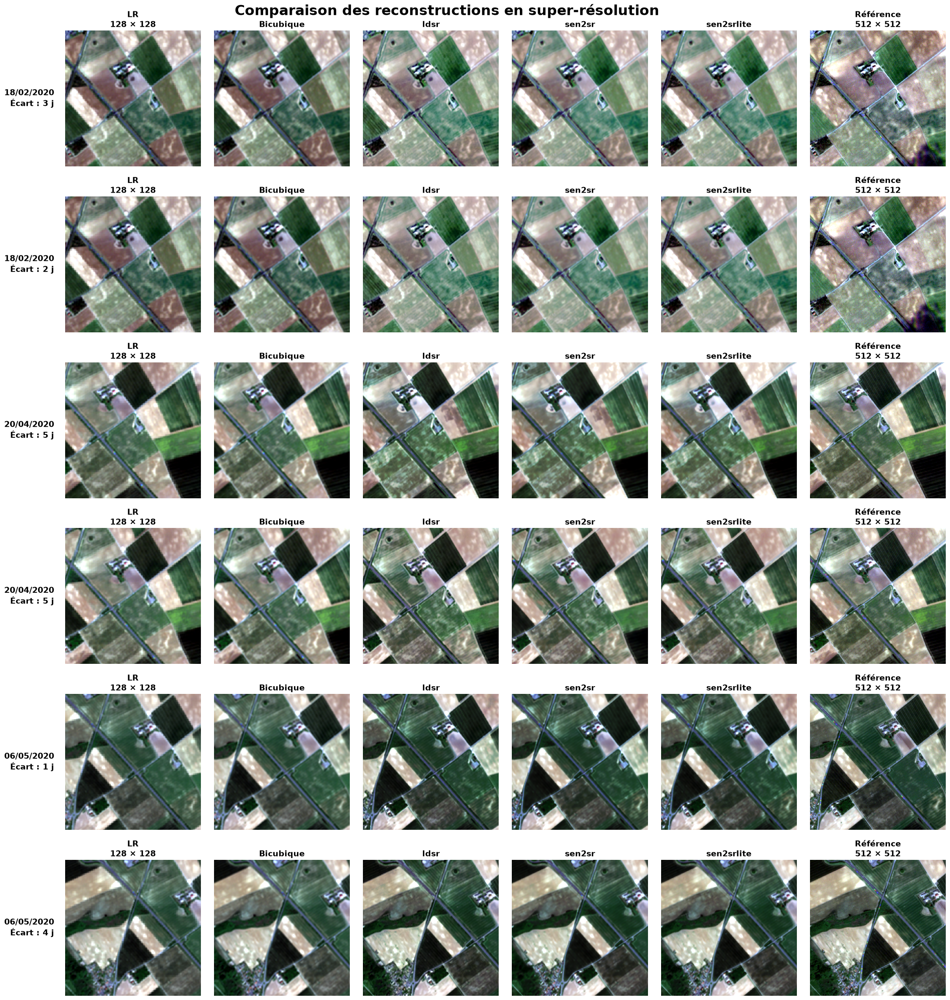


Figure sauvegardée :
C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\report_visualisations_lr_sr\comparaison_toutes_dates.pdf


In [63]:
# ============================================================
# FIGURE UNIQUE POUR LE RAPPORT
#
# Dates empilées verticalement
#
# Colonnes :
# LR | Interpolation bicubique | SR modèles | Référence
#
# Patch choisi dans la zone centrale de l'image
# pour éviter les bandes noires / zones NoData
# ============================================================

if results_df.empty:

    print("Aucune comparaison disponible.")

else:

    show_df = results_df.copy()

    show_df["reference_date"] = pd.to_datetime(
        show_df["reference_date"]
    )

    show_df["sr_date"] = pd.to_datetime(
        show_df["sr_date"]
    )

    show_df = show_df.sort_values(
        [
            "zone",
            "reference_date",
            "sr_date",
            "pair_position",
            "model",
        ]
    ).reset_index(drop=True)

    # --------------------------------------------------------
    # PARAMÈTRES
    # --------------------------------------------------------

    LR_SIZE = 128
    SR_SIZE = 512

    SCALE_FACTOR = 4

    # Marge minimale par rapport aux bords.
    #
    # 0.25 = on utilise la zone centrale de l'image,
    # en évitant environ 25 % de chaque côté.
    CENTRAL_MARGIN = 0.10

    # Nombre maximum d'essais pour trouver
    # un patch sans bord noir / NoData.
    MAX_PATCH_TRIALS = 100

    # Pourcentage maximal de pixels invalides accepté.
    MAX_INVALID_RATIO = 0.01

    rng = np.random.default_rng()

    report_dir = (
        OUTPUT_ROOT
        / "report_visualisations_lr_sr"
    )

    report_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    # --------------------------------------------------------
    # GROUPES
    # --------------------------------------------------------

    groups = (
        show_df[
            [
                "zone",
                "reference_date",
                "sr_date",
                "pair_position",
                "delta_days_sr_ref",
            ]
        ]
        .drop_duplicates()
        .sort_values(
            [
                "zone",
                "reference_date",
                "sr_date",
                "pair_position",
            ]
        )
        .head(6)
    )

    # ========================================================
    # LECTURE RGB
    # ========================================================

    def read_rgb(path):

        with rasterio.open(path) as src:

            arr = src.read(
                [1, 2, 3, 4]
            ).astype(np.float32)

            if src.nodata is not None:

                arr[arr == src.nodata] = np.nan

            rgb = to_rgb(arr)

            return (
                rgb,
                src.transform,
                src.crs,
                src.height,
                src.width,
            )

    # ========================================================
    # BICUBIQUE
    # ========================================================

    def resize_bicubic(img, size):

        """
        Interpolation bicubique.

        Exemple :
        128 x 128 -> 512 x 512

        Facteur = x4
        """

        # Remplacement temporaire des NaN.
        #
        # Normalement les patches sélectionnés ci-dessous
        # ne doivent pratiquement pas en contenir.
        if np.isnan(img).any():

            work = np.nan_to_num(
                img,
                nan=0.0
            )

        else:

            work = img

        result = cv2.resize(
            work.astype(np.float32),
            (size, size),
            interpolation=cv2.INTER_CUBIC,
        )

        return result

    # ========================================================
    # EXTRACTION D'UN PATCH
    # ========================================================

    def crop(
        img,
        transform,
        bounds
    ):

        win = rasterio.windows.from_bounds(
            *bounds,
            transform=transform
        )

        x1 = max(
            0,
            int(np.floor(win.col_off))
        )

        y1 = max(
            0,
            int(np.floor(win.row_off))
        )

        x2 = min(
            img.shape[1],
            int(np.ceil(
                win.col_off + win.width
            ))
        )

        y2 = min(
            img.shape[0],
            int(np.ceil(
                win.row_off + win.height
            ))
        )

        if x2 <= x1 or y2 <= y1:

            return None

        return img[
            y1:y2,
            x1:x2
        ]

    # ========================================================
    # TEST PIXELS VALIDES
    # ========================================================

    def valid_ratio(img):

        """
        Retourne le pourcentage de pixels valides.

        Un pixel est considéré comme valide si aucune
        des composantes RGB n'est NaN.
        """

        if img is None:
            return 0.0

        if img.ndim == 3:

            valid = np.all(
                np.isfinite(img),
                axis=2
            )

        else:

            valid = np.isfinite(img)

        return float(
            np.mean(valid)
        )

    # ========================================================
    # CHOIX D'UN PATCH CENTRAL
    # ========================================================

    def random_central_bounds(
        transform,
        h,
        w,
        size,
        margin=0.25,
    ):

        """
        Sélectionne aléatoirement un patch uniquement
        dans la zone centrale de l'image.

        Exemple avec margin = 0.25 :

        +--------------------------------------+
        |              25 %                    |
        |       +----------------------+       |
        |       |                      |       |
        |       |      ZONE CENTRALE   |       |
        |       |                      |       |
        |       +----------------------+       |
        |              25 %                    |
        +--------------------------------------+

        Cela évite les bords de l'image.
        """

        size = min(
            size,
            h,
            w
        )

        if size <= 0:
            return None

        # Limites de la zone centrale
        x_min = int(
            w * margin
        )

        x_max = int(
            w * (1 - margin)
        ) - size

        y_min = int(
            h * margin
        )

        y_max = int(
            h * (1 - margin)
        ) - size

        # Vérification
        if x_max < x_min:
            return None

        if y_max < y_min:
            return None

        # Position aléatoire dans la zone centrale
        x = int(
            rng.integers(
                x_min,
                x_max + 1
            )
        )

        y = int(
            rng.integers(
                y_min,
                y_max + 1
            )
        )

        win = rasterio.windows.Window(
            x,
            y,
            size,
            size
        )

        return rasterio.windows.bounds(
            win,
            transform
        )

    # ========================================================
    # PRÉPARATION DES LIGNES
    # ========================================================

    rows = []

    for _, g in groups.iterrows():

        gdf = show_df[
            (show_df["zone"] == g["zone"])
            & (
                show_df["reference_date"]
                == g["reference_date"]
            )
            & (
                show_df["sr_date"]
                == g["sr_date"]
            )
            & (
                show_df["pair_position"]
                == g["pair_position"]
            )
        ].sort_values("model")

        if gdf.empty:
            continue

        # ----------------------------------------------------
        # FICHIERS
        # ----------------------------------------------------

        ref_path = Path(
            gdf.iloc[0]["reference_tif"]
        )

        lr_path = Path(
            gdf.iloc[0]["lr_tif"]
        )

        if (
            not ref_path.exists()
            or not lr_path.exists()
        ):
            continue

        # ----------------------------------------------------
        # REFERENCE
        # ----------------------------------------------------

        (
            ref,
            ref_t,
            ref_crs,
            ref_h,
            ref_w,
        ) = read_rgb(
            ref_path
        )

        # ----------------------------------------------------
        # LR
        # ----------------------------------------------------

        (
            lr,
            lr_t,
            lr_crs,
            lr_h,
            lr_w,
        ) = read_rgb(
            lr_path
        )

        if lr_crs != ref_crs:
            continue

        # ====================================================
        # RECHERCHE D'UN BON PATCH
        # ====================================================

        patch_found = False

        for trial in range(
            MAX_PATCH_TRIALS
        ):

            # ------------------------------------------------
            # Choix uniquement au centre
            # ------------------------------------------------

            bounds = random_central_bounds(
                ref_t,
                ref_h,
                ref_w,
                SR_SIZE,
                margin=CENTRAL_MARGIN,
            )

            if bounds is None:
                continue

            # ------------------------------------------------
            # Patch référence
            # ------------------------------------------------

            ref_patch = crop(
                ref,
                ref_t,
                bounds
            )

            if ref_patch is None:
                continue

            # ------------------------------------------------
            # Vérification référence
            # ------------------------------------------------

            if (
                valid_ratio(ref_patch)
                < (1 - MAX_INVALID_RATIO)
            ):
                continue

            # ------------------------------------------------
            # Patch LR
            # ------------------------------------------------

            lr_patch = crop(
                lr,
                lr_t,
                bounds
            )

            if lr_patch is None:
                continue

            # ------------------------------------------------
            # Vérification LR
            # ------------------------------------------------

            if (
                valid_ratio(lr_patch)
                < (1 - MAX_INVALID_RATIO)
            ):
                continue

            # ------------------------------------------------
            # Vérification de chaque modèle SR
            # ------------------------------------------------

            sr_test_patches = []
            sr_test_models = []

            all_sr_valid = True

            for _, r in gdf.iterrows():

                sr_path = Path(
                    r["sr_tif"]
                )

                if not sr_path.exists():

                    all_sr_valid = False
                    break

                (
                    sr,
                    sr_t,
                    sr_crs,
                    _,
                    _,
                ) = read_rgb(
                    sr_path
                )

                if sr_crs != ref_crs:

                    all_sr_valid = False
                    break

                sr_patch = crop(
                    sr,
                    sr_t,
                    bounds
                )

                if sr_patch is None:

                    all_sr_valid = False
                    break

                # ------------------------------------------------
                # Vérifier les pixels invalides
                # ------------------------------------------------

                if (
                    valid_ratio(sr_patch)
                    < (1 - MAX_INVALID_RATIO)
                ):

                    all_sr_valid = False
                    break

                sr_test_patches.append(
                    sr_patch
                )

                sr_test_models.append(
                    str(r["model"])
                )

            if not all_sr_valid:
                continue

            # ------------------------------------------------
            # PATCH ACCEPTÉ
            # ------------------------------------------------

            patch_found = True

            break

        # ====================================================
        # Aucun patch valide trouvé
        # ====================================================

        if not patch_found:

            print(
                f"Impossible de trouver un patch valide "
                f"pour {g['reference_date']:%d/%m/%Y}"
            )

            continue

        # ====================================================
        # MISE À L'ÉCHELLE
        # ====================================================

        # ----------------------------------------------------
        # LR = 128 x 128
        # ----------------------------------------------------

        lr_patch = resize_bicubic(
            lr_patch,
            LR_SIZE
        )

        # ----------------------------------------------------
        # INTERPOLATION BICUBIQUE ×4
        #
        # 128 x 128 -> 512 x 512
        # ----------------------------------------------------

        interp_patch = resize_bicubic(
            lr_patch,
            SR_SIZE
        )

        # ----------------------------------------------------
        # REFERENCE = 512 x 512
        # ----------------------------------------------------

        ref_patch = resize_bicubic(
            ref_patch,
            SR_SIZE
        )

        # ----------------------------------------------------
        # SR = 512 x 512
        # ----------------------------------------------------

        sr_patches = []

        for sr_patch in sr_test_patches:

            sr_patch = resize_bicubic(
                sr_patch,
                SR_SIZE
            )

            sr_patches.append(
                sr_patch
            )

        # ====================================================
        # STOCKAGE
        # ====================================================

        rows.append(
            {
                "date": g["reference_date"],
                "delta": int(
                    g["delta_days_sr_ref"]
                ),
                "lr": lr_patch,
                "interp": interp_patch,
                "sr": sr_patches,
                "models": sr_test_models,
                "ref": ref_patch,
            }
        )

    # ========================================================
    # AFFICHAGE
    # ========================================================

    if not rows:

        print(
            "Aucune figure à afficher."
        )

    else:

        max_sr = max(
            len(r["sr"])
            for r in rows
        )

        # LR
        # Interpolation
        # SR...
        # Référence
        ncols = max_sr + 3

        nrows = len(rows)

        CELL = 4.0

        fig, axes = plt.subplots(
            nrows,
            ncols,
            figsize=(
                CELL * ncols,
                CELL * nrows
            ),
            squeeze=False,
        )

        # ====================================================
        # LIGNES
        # ====================================================

        for i, row in enumerate(rows):

            # ------------------------------------------------
            # LR
            # ------------------------------------------------

            ax = axes[i, 0]

            ax.imshow(
                row["lr"],
                interpolation="nearest",
                aspect="equal",
            )

            ax.set_title(
                "LR\n128 × 128",
                fontsize=14,
                fontweight="bold",
            )

            ax.axis("off")

            # ------------------------------------------------
            # INTERPOLATION
            # ------------------------------------------------

            ax = axes[i, 1]

            ax.imshow(
                row["interp"],
                interpolation="nearest",
                aspect="equal",
            )

            ax.set_title(
                "Bicubique",
                fontsize=14,
                fontweight="bold",
            )

            ax.axis("off")

            # ------------------------------------------------
            # SR
            # ------------------------------------------------

            for j, (
                patch,
                model
            ) in enumerate(
                zip(
                    row["sr"],
                    row["models"]
                ),
                2
            ):

                ax = axes[i, j]

                ax.imshow(
                    patch,
                    interpolation="nearest",
                    aspect="equal",
                )

                ax.set_title(
                    model,
                    fontsize=14,
                    fontweight="bold",
                )

                ax.axis("off")

            # ------------------------------------------------
            # REFERENCE
            # ------------------------------------------------

            ref_col = max_sr + 2

            ax = axes[i, ref_col]

            ax.imshow(
                row["ref"],
                interpolation="nearest",
                aspect="equal",
            )

            ax.set_title(
                "Référence\n512 × 512",
                fontsize=14,
                fontweight="bold",
            )

            ax.axis("off")

            # ------------------------------------------------
            # CACHER CELLULES INUTILISÉES
            # ------------------------------------------------

            for j in range(
                len(row["sr"]) + 2,
                ref_col
            ):

                axes[i, j].axis("off")

            # ------------------------------------------------
            # DATE À GAUCHE
            # ------------------------------------------------

            axes[i, 0].text(
                -0.08,
                0.5,
                (
                    f"{row['date']:%d/%m/%Y}\n"
                    f"Écart : {row['delta']} j"
                ),
                transform=axes[i, 0].transAxes,
                ha="right",
                va="center",
                fontsize=14,
                fontweight="bold",
            )

        # ====================================================
        # TITRE
        # ====================================================

        fig.suptitle(
            "Comparaison des reconstructions "
            "en super-résolution",
            fontsize=24,
            fontweight="bold",
            y=0.996,
        )

        # ====================================================
        # MISE EN PAGE
        # ====================================================

        plt.subplots_adjust(
            left=0.12,
            right=0.995,
            top=0.97,
            bottom=0.02,
            wspace=0.04,
            hspace=0.22,
        )

        # ====================================================
        # SAUVEGARDE
        # ====================================================

        output_path = (
            report_dir
            / "comparaison_toutes_dates.pdf"
        )

        fig.savefig(
            output_path,
            dpi=600,
            bbox_inches="tight",
            facecolor="white",
        )

        plt.show()

        plt.close(fig)

        print(
            f"\nFigure sauvegardée :\n"
            f"{output_path}"
        )

In [67]:
if results_df.empty:
    print("Aucune comparaison disponible pour construire le tableau de rapport.")
else:
    rapport_base = results_df.copy()
    rapport_base["reference_date"] = pd.to_datetime(rapport_base["reference_date"])
    rapport_base["sr_date"] = pd.to_datetime(rapport_base["sr_date"])

    def build_baseline_row(g):
        first = g.iloc[0]
        return {
            "modele": "interpolation_directe",
            "position_paire": "baseline",
            "date_sr": pd.Timestamp(first["reference_date"]).strftime("%d/%m/%Y"),
            "ecart_jours": 0,
            "psnr": None if pd.isna(first["baseline_PSNR"]) else round(float(first["baseline_PSNR"]), 4),
            "ssim": None if pd.isna(first["baseline_SSIM"]) else round(float(first["baseline_SSIM"]), 4),
            "rmse": None if pd.isna(first["baseline_RMSE"]) else round(float(first["baseline_RMSE"]), 4),
            "sam": None if pd.isna(first["baseline_SAM"]) else round(float(first["baseline_SAM"]), 4),
            "lpips": None if pd.isna(first["baseline_LPIPS"]) else round(float(first["baseline_LPIPS"]), 4),
        }

    def construire_liste_modeles(g):
        g = g.sort_values(
            ["model", "delta_days_sr_ref", "SSIM"],
            ascending=[True, True, False]
        )
        out = [build_baseline_row(g)]
        for _, r in g.iterrows():
            out.append({
                "modele": str(r["model"]),
                "position_paire": str(r["pair_position"]),
                "date_sr": pd.Timestamp(r["sr_date"]).strftime("%d/%m/%Y"),
                "ecart_jours": int(r["delta_days_sr_ref"]),
                "psnr": None if pd.isna(r["PSNR"]) else round(float(r["PSNR"]), 4),
                "ssim": None if pd.isna(r["SSIM"]) else round(float(r["SSIM"]), 4),
                "rmse": None if pd.isna(r["RMSE"]) else round(float(r["RMSE"]), 4),
                "sam": None if pd.isna(r["SAM"]) else round(float(r["SAM"]), 4),
                "lpips": None if pd.isna(r["LPIPS"]) else round(float(r["LPIPS"]), 4),
            })
        return out

    rapport_rows = []
    for (zone, reference_date), g in rapport_base.groupby(["zone", "reference_date"], sort=True):
        rapport_rows.append({
            "zone": zone,
            "reference_date": pd.to_datetime(reference_date),
            "resultats_modeles": construire_liste_modeles(g),
        })

    df_rapport_fr = pd.DataFrame(rapport_rows)

    if not df_rapport_fr.empty:
        df_rapport_fr["reference_date"] = pd.to_datetime(df_rapport_fr["reference_date"])
        df_rapport_fr["date_reference"] = df_rapport_fr["reference_date"].dt.strftime("%d/%m/%Y")
        df_rapport_fr = df_rapport_fr[["zone", "date_reference", "resultats_modeles"]]
    else:
        df_rapport_fr = pd.DataFrame(columns=["zone", "date_reference", "resultats_modeles"])

    rapport_json = OUTPUT_ROOT / "tableau_rapport_fr_resultats_par_date.json"
    df_rapport_fr.to_json(rapport_json, orient="records", force_ascii=False, indent=2)

    print("Tableau FR cree:")
    display(df_rapport_fr.head(12))
    print("Sauvegarde JSON:", rapport_json)

    baseline_detail = (
        rapport_base
        .drop_duplicates(["zone", "reference_date"])
        .copy()
        .assign(
            zone=lambda d: d["zone"],
            modele="interpolation_directe",
            position_paire="baseline",
            date_reference=lambda d: d["reference_date"],
            date_sr=lambda d: d["reference_date"],
            ecart_jours_sr_reference=0,
            psnr=lambda d: d["baseline_PSNR"],
            ssim=lambda d: d["baseline_SSIM"],
            rmse=lambda d: d["baseline_RMSE"],
            sam=lambda d: d["baseline_SAM"],
            lpips=lambda d: d["baseline_LPIPS"],
        )
    )

    sr_detail = rapport_base.assign(
        zone=rapport_base["zone"],
        modele=rapport_base["model"],
        position_paire=rapport_base["pair_position"],
        date_reference=rapport_base["reference_date"],
        date_sr=rapport_base["sr_date"],
        ecart_jours_sr_reference=rapport_base["delta_days_sr_ref"],
        psnr=rapport_base["PSNR"],
        ssim=rapport_base["SSIM"],
        rmse=rapport_base["RMSE"],
        sam=rapport_base["SAM"],
        lpips=rapport_base["LPIPS"],
    )

    common_cols = [
        "zone",
        "modele",
        "position_paire",
        "date_reference",
        "date_sr",
        "ecart_jours_sr_reference",
        "psnr",
        "ssim",
        "rmse",
        "sam",
        "lpips",
    ]

    df_rapport_fr_detail = pd.concat(
        [
            baseline_detail[common_cols],
            sr_detail[common_cols],
        ],
        ignore_index=True,
    )

    df_rapport_fr_detail["date_reference"] = pd.to_datetime(df_rapport_fr_detail["date_reference"]).dt.strftime("%d/%m/%Y")
    df_rapport_fr_detail["date_sr"] = pd.to_datetime(df_rapport_fr_detail["date_sr"]).dt.strftime("%d/%m/%Y")
    df_rapport_fr_detail = df_rapport_fr_detail.sort_values(
        ["zone", "date_reference", "modele", "position_paire"]
    ).reset_index(drop=True)

    detail_csv = OUTPUT_ROOT / "tableau_rapport_fr_detail.csv"
    df_rapport_fr_detail.to_csv(detail_csv, index=False)
    print("Sauvegarde CSV detail:", detail_csv)
    display(df_rapport_fr_detail.head(20))

    # Nouveau tableau:
    # pour chaque date_reference, garder la meilleure comparaison par modele
    # entre before et after, et ajouter la baseline interpolee
    # sans colonnes zone ni position_paire
    best_model_rows = (
        rapport_base.sort_values(
            by=[
                "zone",
                "model",
                "reference_date",
                "SSIM",
                "PSNR",
                "RMSE",
                "SAM",
                "LPIPS",
                "delta_days_sr_ref",
            ],
            ascending=[True, True, True, False, False, True, True, True, True],
        )
        .groupby(["zone", "model", "reference_date"], as_index=False)
        .head(1)
        .copy()
    )

    baseline_best = (
        rapport_base
        .drop_duplicates(["zone", "reference_date"])
        .assign(
            date_sr=lambda d: d["reference_date"],
            ecart_jours_sr_reference=0,
            modele="interpolation_directe",
            psnr=lambda d: d["baseline_PSNR"],
            ssim=lambda d: d["baseline_SSIM"],
            rmse=lambda d: d["baseline_RMSE"],
            sam=lambda d: d["baseline_SAM"],
            lpips=lambda d: d["baseline_LPIPS"],
        )
        [["reference_date", "date_sr", "ecart_jours_sr_reference", "modele", "psnr", "ssim", "rmse", "sam", "lpips"]]
    )

    best_sr_export = (
        best_model_rows.assign(
            date_sr=best_model_rows["sr_date"],
            ecart_jours_sr_reference=best_model_rows["delta_days_sr_ref"],
            modele=best_model_rows["model"],
            psnr=best_model_rows["PSNR"],
            ssim=best_model_rows["SSIM"],
            rmse=best_model_rows["RMSE"],
            sam=best_model_rows["SAM"],
            lpips=best_model_rows["LPIPS"],
        )
        [["reference_date", "date_sr", "ecart_jours_sr_reference", "modele", "psnr", "ssim", "rmse", "sam", "lpips"]]
    )

    df_rapport_fr_best_par_date = pd.concat(
        [baseline_best, best_sr_export],
        ignore_index=True,
    )

    df_rapport_fr_best_par_date["date_reference"] = pd.to_datetime(df_rapport_fr_best_par_date["reference_date"]).dt.strftime("%d/%m/%Y")
    df_rapport_fr_best_par_date["date_sr"] = pd.to_datetime(df_rapport_fr_best_par_date["date_sr"]).dt.strftime("%d/%m/%Y")
    df_rapport_fr_best_par_date = df_rapport_fr_best_par_date[
        ["date_reference", "date_sr", "ecart_jours_sr_reference", "modele", "psnr", "ssim", "rmse", "sam", "lpips"]
    ]
    df_rapport_fr_best_par_date = df_rapport_fr_best_par_date.sort_values(
        ["date_reference", "modele"]
    ).reset_index(drop=True)

    best_per_date_csv = OUTPUT_ROOT / "tableau_rapport_fr_best_par_date.csv"
    df_rapport_fr_best_par_date.to_csv(best_per_date_csv, index=False)
    print("Sauvegarde CSV best par date:", best_per_date_csv)
    display(df_rapport_fr_best_par_date.head(20))

Tableau FR cree:


,zone,date_reference,resultats_modeles
0,zone_2_betterave,18/02/2020,"[{'modele': 'interpolation_directe', 'position..."
1,zone_2_betterave,20/04/2020,"[{'modele': 'interpolation_directe', 'position..."
2,zone_2_betterave,06/05/2020,"[{'modele': 'interpolation_directe', 'position..."
3,zone_2_betterave,08/08/2020,"[{'modele': 'interpolation_directe', 'position..."
4,zone_2_betterave,31/10/2020,"[{'modele': 'interpolation_directe', 'position..."


Sauvegarde JSON: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\tableau_rapport_fr_resultats_par_date.json
Sauvegarde CSV detail: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\tableau_rapport_fr_detail.csv


,zone,modele,position_paire,date_reference,date_sr,ecart_jours_sr_reference,psnr,ssim,rmse,sam,lpips
0,zone_2_betterave,interpolation_directe,baseline,06/05/2020,06/05/2020,0,35.400495,0.914884,121.606453,1.368025,0.102396
1,zone_2_betterave,ldsr,after,06/05/2020,10/05/2020,4,35.939490,0.928400,135.649109,1.580436,0.325535
2,zone_2_betterave,ldsr,before,06/05/2020,05/05/2020,1,35.812330,0.928522,133.256699,1.479654,0.326816
3,zone_2_betterave,sen2sr,after,06/05/2020,10/05/2020,4,35.904288,0.929391,148.205719,1.592373,0.338381
4,zone_2_betterave,sen2sr,before,06/05/2020,05/05/2020,1,35.733209,0.929192,147.131699,1.533665,0.338664
5,zone_2_betterave,sen2srlite,after,06/05/2020,10/05/2020,4,36.074316,0.932731,140.252686,1.565882,0.337399
6,zone_2_betterave,sen2srlite,before,06/05/2020,05/05/2020,1,35.935005,0.932641,138.262024,1.497579,0.337682
7,zone_2_betterave,interpolation_directe,baseline,08/08/2020,08/08/2020,0,36.388425,0.942017,87.368927,1.134790,0.063201
8,zone_2_betterave,ldsr,after,08/08/2020,13/08/2020,5,29.904899,0.921088,218.954819,1.780120,0.343863
9,zone_2_betterave,ldsr,before,08/08/2020,03/08/2020,5,35.308687,0.937472,115.422211,1.452527,0.335813


Sauvegarde CSV best par date: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\tableau_rapport_fr_best_par_date.csv


,date_reference,date_sr,ecart_jours_sr_reference,modele,psnr,ssim,rmse,sam,lpips
0,06/05/2020,06/05/2020,0,interpolation_directe,35.400495,0.914884,121.606453,1.368025,0.102396
1,06/05/2020,05/05/2020,1,ldsr,35.812330,0.928522,133.256699,1.479654,0.326816
2,06/05/2020,10/05/2020,4,sen2sr,35.904288,0.929391,148.205719,1.592373,0.338381
3,06/05/2020,10/05/2020,4,sen2srlite,36.074316,0.932731,140.252686,1.565882,0.337399
4,08/08/2020,08/08/2020,0,interpolation_directe,36.388425,0.942017,87.368927,1.134790,0.063201
5,08/08/2020,03/08/2020,5,ldsr,35.308687,0.937472,115.422211,1.452527,0.335813
6,08/08/2020,03/08/2020,5,sen2sr,35.414702,0.943950,123.440605,1.495757,0.332040
7,08/08/2020,03/08/2020,5,sen2srlite,35.607519,0.947652,117.694008,1.441968,0.327783
8,18/02/2020,18/02/2020,0,interpolation_directe,29.921949,0.864371,188.257797,2.660990,0.120415
9,18/02/2020,15/02/2020,3,ldsr,30.747223,0.883022,182.346420,2.579505,0.361915


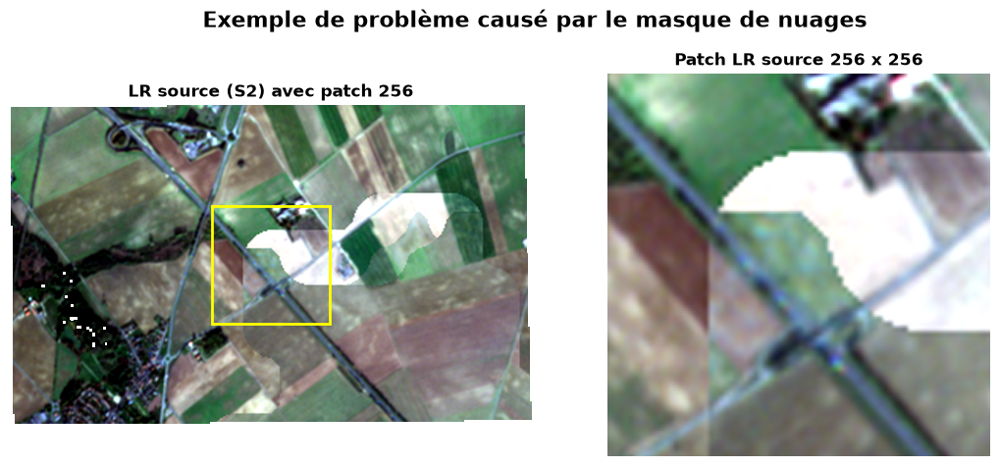

Image sauvegardee: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\outputs\evaluation_pairs_two_zones\report_visualisations_lr_sr\worst_comparison_lr_patch_256_from_source.png
Pire comparaison selectionnee:


,zone,modele,date_reference,date_lr_source,PSNR,SSIM,RMSE,SAM,LPIPS,score_mauvais
0,zone_2_betterave,sen2sr,31/10/2020,01/11/2020,30.678776,0.889451,267.637848,4.311635,0.394222,0.947412


In [50]:
# ============================================================
# PATCH LR (256x256) POUR LA PIREE COMPARAISON
# Lecture directe depuis les images originales (sans fichiers de comparaison)
# ============================================================

if results_df.empty:
    print("Aucune comparaison disponible.")
else:
    base = results_df.copy()

    for c in ["PSNR", "SSIM", "RMSE", "SAM", "LPIPS"]:
        base[c] = pd.to_numeric(base[c], errors="coerce")

    comparisons = base.dropna(subset=["PSNR", "SSIM", "RMSE", "SAM", "LPIPS", "zone", "model", "reference_date"]).copy()
    if comparisons.empty:
        print("Impossible de classer les comparaisons (metriques manquantes).")
    else:
        # Score de mauvaise qualite:
        # PSNR/SSIM faibles = mauvais ; RMSE/SAM/LPIPS eleves = mauvais.
        def n01(series):
            lo = series.min()
            hi = series.max()
            if not np.isfinite(lo) or not np.isfinite(hi) or hi - lo < 1e-12:
                return pd.Series(np.zeros(len(series)), index=series.index)
            return (series - lo) / (hi - lo)

        comparisons["bad_psnr"] = 1.0 - n01(comparisons["PSNR"])
        comparisons["bad_ssim"] = 1.0 - n01(comparisons["SSIM"])
        comparisons["bad_rmse"] = n01(comparisons["RMSE"])
        comparisons["bad_sam"] = n01(comparisons["SAM"])
        comparisons["bad_lpips"] = n01(comparisons["LPIPS"])
        comparisons["bad_score"] = comparisons[
            ["bad_psnr", "bad_ssim", "bad_rmse", "bad_sam", "bad_lpips"]
        ].mean(axis=1)

        worst = comparisons.sort_values("bad_score", ascending=False).iloc[0]

        zone_name = str(worst["zone"])
        model_name = str(worst["model"])
        ref_date = pd.to_datetime(worst["reference_date"]).to_pydatetime()

        # Charger les references PS depuis les sources originales pour reconstruire le profil geometrique.
        refs = filter_references(screen_ps_scenes(zone_name))
        refs_on_date = [r for r in refs if r["date"].date() == ref_date.date()]

        if not refs_on_date:
            print(f"Aucune reference PS source trouvee pour {zone_name} a la date {ref_date:%Y-%m-%d}.")
        else:
            # S'il y a plusieurs scenes le meme jour, on prend la meilleure couverture.
            ref_item = sorted(refs_on_date, key=lambda x: x["coverage"], reverse=True)[0]
            ref_profile = ref_item["profile"]

            try:
                lr_arr, lr_date = extract_lr_from_stack(
                    S2_STACK_PATH,
                    ZONE_PATHS[zone_name],
                    ref_date,
                    model_name,
                    ref_profile,
                )
            except Exception as exc:
                print("Erreur lors de la reconstruction LR depuis la source:", exc)
                lr_arr = None
                lr_date = None

            if lr_arr is None:
                print("Echec de reconstruction de l'image LR.")
            else:
                lr_img = to_rgb(lr_arr)

                # Patch 256x256 au centre.
                patch_size = 256
                h, w = lr_img.shape[:2]
                p = min(patch_size, h, w)
                y0 = max(0, (h - p) // 2)
                x0 = max(0, (w - p) // 2)
                y1, x1 = y0 + p, x0 + p
                lr_patch = lr_img[y0:y1, x0:x1]

                fig, axes = plt.subplots(1, 2, figsize=(11, 4.8))
                axes[0].imshow(lr_img)
                rect = plt.Rectangle((x0, y0), p, p, fill=False, edgecolor="yellow", linewidth=2.0)
                axes[0].add_patch(rect)
                axes[0].set_title("LR source (S2) avec patch 256", fontweight="bold")
                axes[0].axis("off")

                axes[1].imshow(lr_patch)
                axes[1].set_title("Patch LR source 256 x 256", fontweight="bold")
                axes[1].axis("off")

                title = ("Exemple de problème causé par le masque de nuages")
                fig.suptitle(title, fontsize=16,fontweight="bold")
                plt.tight_layout()

                vis_dir = OUTPUT_ROOT / "report_visualisations_lr_sr"
                vis_dir.mkdir(parents=True, exist_ok=True)
                out_file = vis_dir / "worst_comparison_lr_patch_256_from_source.png"
                fig.savefig(out_file, dpi=250, bbox_inches="tight", facecolor="white")
                plt.show()
                plt.close(fig)

                print("Image sauvegardee:", out_file)
                print("Pire comparaison selectionnee:")
                display(
                    pd.DataFrame([
                        {
                            "zone": zone_name,
                            "modele": model_name,
                            "date_reference": ref_date.strftime("%d/%m/%Y"),
                            "date_lr_source": lr_date.strftime("%d/%m/%Y") if lr_date is not None else "",
                            "PSNR": float(worst["PSNR"]),
                            "SSIM": float(worst["SSIM"]),
                            "RMSE": float(worst["RMSE"]),
                            "SAM": float(worst["SAM"]),
                            "LPIPS": float(worst["LPIPS"]),
                            "score_mauvais": float(worst["bad_score"]),
                        }
                    ])
                )

Zone: zone_2_betterave | Modele: sen2srlite
Reference PlanetScope: 2020-05-06
SR (before): 2020-05-05
Fichier: 2020-05-05.tif


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_16068\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_16068\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_16068\3206087028.py:59: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  band = src.read(b, out_dtype='float32')
C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_16068\3206087028.py:59: DeprecationWarning: Setting the shape on a

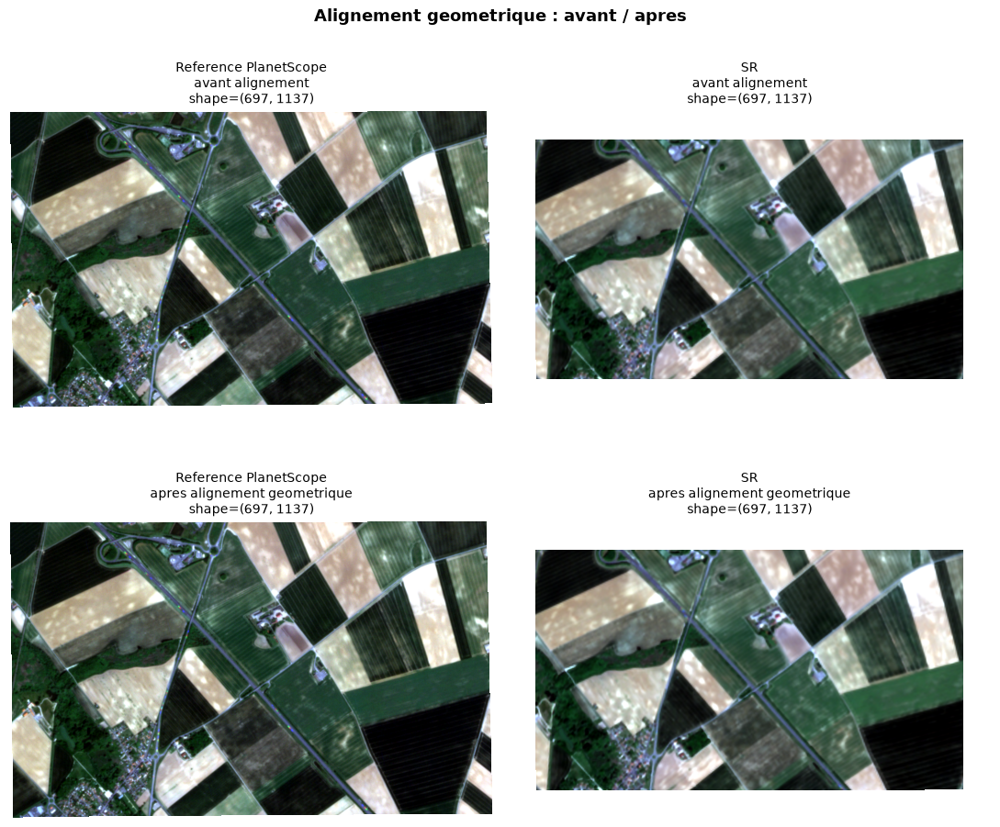



RANGES AVANT HISTOGRAM MATCHING

Blue:
  PlanetScope : min=0.0051, max=0.1896, mean=0.0356, median=0.0281
  SR          : min=0.0128, max=0.2226, mean=0.0559, median=0.0487

Green:
  PlanetScope : min=0.0299, max=0.2528, mean=0.0818, median=0.0717
  SR          : min=0.0200, max=0.2840, mean=0.0881, median=0.0815

Red:
  PlanetScope : min=0.0249, max=0.2929, mean=0.0882, median=0.0664
  SR          : min=0.0141, max=0.3426, mean=0.0940, median=0.0756

NIR:
  PlanetScope : min=0.1277, max=0.5525, mean=0.3735, median=0.3785
  SR          : min=-0.0153, max=0.5995, mean=0.3523, median=0.3645


RANGES APRES HISTOGRAM MATCHING

Blue:
  SR apres    : min=0.0051, max=0.1896, mean=0.0356, median=0.0281

Green:
  SR apres    : min=0.0299, max=0.2528, mean=0.0818, median=0.0717

Red:
  SR apres    : min=0.0249, max=0.2929, mean=0.0882, median=0.0664

NIR:
  SR apres    : min=0.1277, max=0.5525, mean=0.3735, median=0.3785


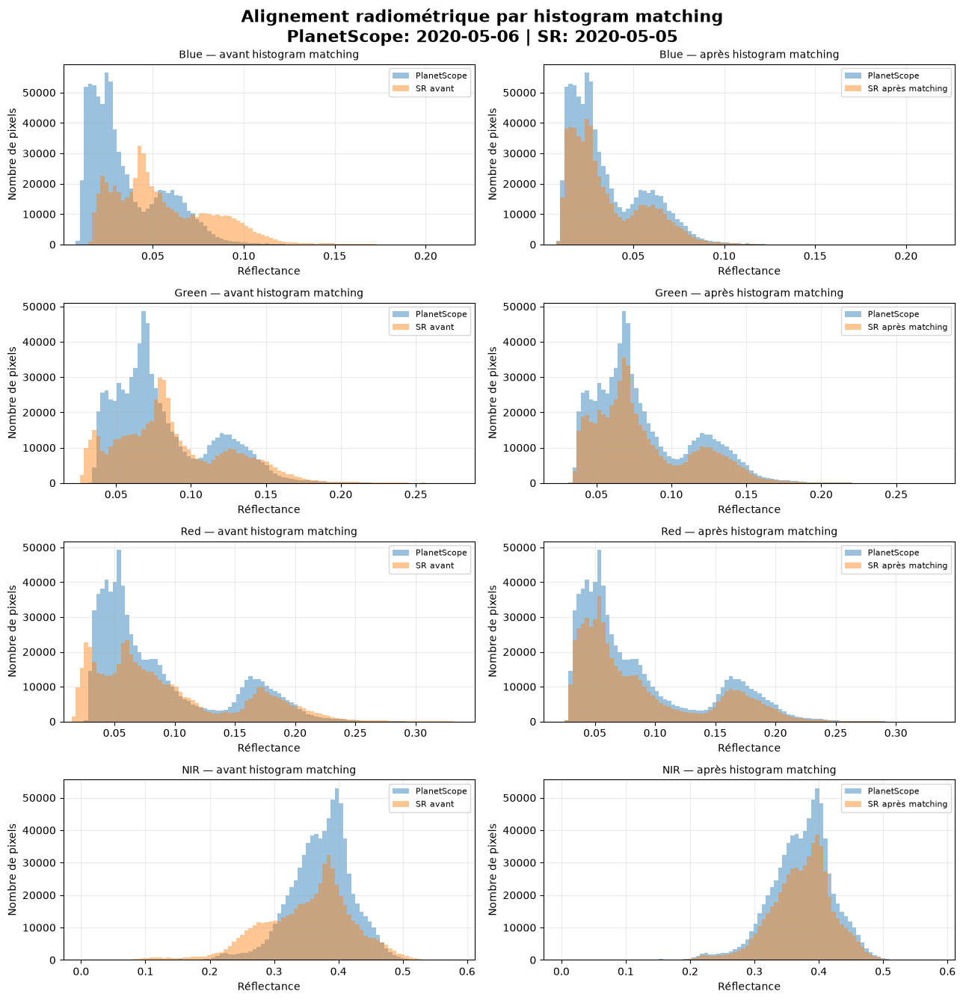



VERIFICATION DE L'ALIGNEMENT
  geom_shape_ok: True
  geom_valid_ratio: 0.7188579273655533
  rmse_before_rad_match: 0.02639022096991539
  rmse_after_rad_match: 0.013826202601194382
  radiometric_improved: True


In [13]:
# ============================================================
# VISUALISATION DE L'ALIGNEMENT GEOMETRIQUE ET RADIOMETRIQUE
#
# IMPORTANT :
# PlanetScope est ici en valeurs scalées (~ réflectance * 10000)
# alors que le SR est déjà en réflectance (~ [0,1]).
#
# On convertit donc PlanetScope en réflectance [0,1] AVANT
# le histogram matching.
#
# Ensuite :
#   - même unité pour PlanetScope et SR
#   - histogram matching en réflectance
#   - histogrammes avec mêmes bins
#   - nombre de pixels
#   - transparence
# ============================================================


VIS_ZONE = ACTIVE_ZONES[0]
VIS_MODEL = list(SR_ZONE_ROUTING[VIS_ZONE].keys())[0]
VIS_REF_INDEX = 3


# ============================================================
# 1) SELECTION DE LA REFERENCE
# ============================================================

refs_vis = filter_references(screen_ps_scenes(VIS_ZONE))

if not refs_vis:

    print("Aucune reference disponible pour la visualisation.")

else:

    VIS_REF_INDEX = min(
        VIS_REF_INDEX,
        len(refs_vis) - 1
    )

    ref_item = refs_vis[VIS_REF_INDEX]

    ref_date = ref_item["date"]
    ref_arr_raw = ref_item["array"]
    ref_profile = ref_item["profile"]


    # ========================================================
    # 2) RECHERCHE DU SR LE PLUS PROCHE
    # ========================================================

    sr_dir = SR_ZONE_ROUTING[VIS_ZONE][VIS_MODEL]

    sr_files = find_sr_files(sr_dir)

    dated_sr = [
        (p, parse_date_from_name(p))
        for p in sr_files
    ]

    dated_sr = [
        (p, d)
        for p, d in dated_sr
        if d is not None
    ]

    selected = choose_before_after(
        ref_date,
        dated_sr,
        max_delta_days=(
            MAX_DELTA_DAYS
            if 'MAX_DELTA_DAYS' in dir()
            else 5
        )
    )


    if not selected:

        print(
            f"Aucune image SR trouvee pres de "
            f"{ref_date:%Y-%m-%d}."
        )

    else:

        rel_pos, (sr_path, sr_date) = min(
            selected,
            key=lambda x: abs(
                (x[1][1] - ref_date).days
            )
        )


        print(
            f"Zone: {VIS_ZONE} | "
            f"Modele: {VIS_MODEL}"
        )

        print(
            f"Reference PlanetScope: "
            f"{ref_date:%Y-%m-%d}"
        )

        print(
            f"SR ({rel_pos}): "
            f"{sr_date:%Y-%m-%d}"
        )

        print(
            f"Fichier: {sr_path.name}"
        )


        # ====================================================
        # 3) WARP DU SR VERS LA GRILLE PLANETSCOPE
        # ====================================================

        sr_warped = warp_sr_to_ps(
            sr_path,
            ref_profile
        )

        idx = S2_TO_PS_IDX[VIS_MODEL]

        sr_arr_raw = sr_warped[idx]


        # ====================================================
        # 4) ALIGNEMENT GEOMETRIQUE
        # ====================================================

        ref_before_raw = ref_arr_raw
        sr_before = sr_arr_raw

        ref_after_raw, sr_after = align_arrays_center_crop(
            ref_arr_raw,
            sr_arr_raw
        )


        # ====================================================
        # 5) VISUALISATION GEOMETRIQUE
        # ====================================================

        fig, axes = plt.subplots(
            2,
            2,
            figsize=(11, 10)
        )


        axes[0, 0].imshow(
            to_rgb(ref_before_raw)
        )

        axes[0, 0].set_title(
            f"Reference PlanetScope\n"
            f"avant alignement\n"
            f"shape={ref_before_raw.shape[1:]}",
            fontsize=10
        )

        axes[0, 0].axis("off")


        axes[0, 1].imshow(
            to_rgb(sr_before)
        )

        axes[0, 1].set_title(
            f"SR\n"
            f"avant alignement\n"
            f"shape={sr_before.shape[1:]}",
            fontsize=10
        )

        axes[0, 1].axis("off")


        axes[1, 0].imshow(
            to_rgb(ref_after_raw)
        )

        axes[1, 0].set_title(
            f"Reference PlanetScope\n"
            f"apres alignement geometrique\n"
            f"shape={ref_after_raw.shape[1:]}",
            fontsize=10
        )

        axes[1, 0].axis("off")


        axes[1, 1].imshow(
            to_rgb(sr_after)
        )

        axes[1, 1].set_title(
            f"SR\n"
            f"apres alignement geometrique\n"
            f"shape={sr_after.shape[1:]}",
            fontsize=10
        )

        axes[1, 1].axis("off")


        fig.suptitle(
            "Alignement geometrique : avant / apres",
            fontsize=13,
            fontweight="bold"
        )

        plt.tight_layout()
        plt.show()
        plt.close(fig)


        # ====================================================
        # 6) CONVERSION PLANETSCOPE → REFLECTANCE
        # ====================================================
        #
        # PlanetScope :
        #
        #       DN ≈ reflectance × 10000
        #
        # Exemple :
        #
        #       1896 → 0.1896
        #       5525 → 0.5525
        #
        # Le SR est deja en reflectance.
        #
        # ====================================================

        PLANETSCOPE_SCALE = 10000.0

        ref_after = (
            ref_after_raw.astype(np.float32)
            / PLANETSCOPE_SCALE
        )


        # ====================================================
        # 7) VERIFICATION DES RANGES AVANT MATCHING
        # ====================================================

        band_names = [
            "Blue",
            "Green",
            "Red",
            "NIR"
        ]

        n_bands = ref_after.shape[0]


        print("\n")
        print("=" * 70)
        print("RANGES AVANT HISTOGRAM MATCHING")
        print("=" * 70)


        for b in range(n_bands):

            band_label = (
                band_names[b]
                if b < len(band_names)
                else f"Band {b + 1}"
            )


            ref_valid = ref_after[b][
                np.isfinite(ref_after[b])
            ]


            sr_valid = sr_after[b][
                np.isfinite(sr_after[b])
            ]


            print(f"\n{band_label}:")


            if ref_valid.size > 0:

                print(
                    f"  PlanetScope : "
                    f"min={np.min(ref_valid):.4f}, "
                    f"max={np.max(ref_valid):.4f}, "
                    f"mean={np.mean(ref_valid):.4f}, "
                    f"median={np.median(ref_valid):.4f}"
                )


            if sr_valid.size > 0:

                print(
                    f"  SR          : "
                    f"min={np.min(sr_valid):.4f}, "
                    f"max={np.max(sr_valid):.4f}, "
                    f"mean={np.mean(sr_valid):.4f}, "
                    f"median={np.median(sr_valid):.4f}"
                )


        # ====================================================
        # 8) HISTOGRAM MATCHING
        # ====================================================
        #
        # IMPORTANT :
        # Le matching est maintenant réalisé entre deux images
        # exprimées dans la MEME unité :
        #
        #       PlanetScope → réflectance [~0,1]
        #       SR          → réflectance [~0,1]
        #
        # ====================================================

        sr_eq = match_histograms_bandwise(
            sr_after,
            ref_after
        )


        # ====================================================
        # 9) RANGES APRES HISTOGRAM MATCHING
        # ====================================================

        print("\n")
        print("=" * 70)
        print("RANGES APRES HISTOGRAM MATCHING")
        print("=" * 70)


        for b in range(n_bands):

            band_label = (
                band_names[b]
                if b < len(band_names)
                else f"Band {b + 1}"
            )


            sr_eq_valid = sr_eq[b][
                np.isfinite(sr_eq[b])
            ]


            if sr_eq_valid.size > 0:

                print(
                    f"\n{band_label}:"
                )

                print(
                    f"  SR apres    : "
                    f"min={np.min(sr_eq_valid):.4f}, "
                    f"max={np.max(sr_eq_valid):.4f}, "
                    f"mean={np.mean(sr_eq_valid):.4f}, "
                    f"median={np.median(sr_eq_valid):.4f}"
                )


        # ====================================================
        # 10) PREPARATION DES HISTOGRAMMES
        # ====================================================

        # ----------------------------------------------------
        # NE PAS forcer artificiellement [0,1].
        #
        # On détermine ici une plage commune pour chaque bande,
        # à partir des valeurs réelles de PlanetScope et SR.
        #
        # On conserve toutefois une petite marge visuelle.
        # ----------------------------------------------------

        fig, axes = plt.subplots(
            n_bands,
            2,
            figsize=(13, 3.4 * n_bands)
        )


        if n_bands == 1:
            axes = axes.reshape(1, 2)


        # ====================================================
        # 11) HISTOGRAMMES BANDE PAR BANDE
        # ====================================================

        for b in range(n_bands):

            band_label = (
                band_names[b]
                if b < len(band_names)
                else f"Band {b + 1}"
            )


            # ------------------------------------------------
            # Pixels valides
            # ------------------------------------------------

            ref_vals = ref_after[b][
                np.isfinite(ref_after[b])
            ].ravel()


            sr_before_vals = sr_after[b][
                np.isfinite(sr_after[b])
            ].ravel()


            sr_after_vals = sr_eq[b][
                np.isfinite(sr_eq[b])
            ].ravel()


            # ------------------------------------------------
            # RANGE COMMUN
            # ------------------------------------------------

            all_vals = np.concatenate(
                [
                    ref_vals,
                    sr_before_vals,
                    sr_after_vals
                ]
            )


            data_min = np.min(all_vals)
            data_max = np.max(all_vals)


            # Petite marge autour des données
            margin = (
                0.02 * (data_max - data_min)
                if data_max > data_min
                else 0.01
            )


            x_min = data_min - margin
            x_max = data_max + margin


            # ------------------------------------------------
            # MEMES BINS pour les trois distributions
            # ------------------------------------------------

            bins = np.linspace(
                x_min,
                x_max,
                101
            )


            # =================================================
            # AVANT MATCHING
            # =================================================

            ax = axes[b, 0]


            ax.hist(
                ref_vals,
                bins=bins,
                density=False,
                alpha=0.45,
                label="PlanetScope",
                edgecolor="none"
            )


            ax.hist(
                sr_before_vals,
                bins=bins,
                density=False,
                alpha=0.45,
                label="SR avant",
                edgecolor="none"
            )


            ax.set_title(
                f"{band_label} — avant histogram matching",
                fontsize=10
            )


            ax.set_xlabel(
                "Réflectance"
            )

            ax.set_ylabel(
                "Nombre de pixels"
            )


            ax.set_xlim(
                x_min,
                x_max
            )


            ax.grid(
                alpha=0.25
            )


            ax.legend(
                fontsize=8
            )


            # =================================================
            # APRES MATCHING
            # =================================================

            ax = axes[b, 1]


            ax.hist(
                ref_vals,
                bins=bins,
                density=False,
                alpha=0.45,
                label="PlanetScope",
                edgecolor="none"
            )


            ax.hist(
                sr_after_vals,
                bins=bins,
                density=False,
                alpha=0.45,
                label="SR après matching",
                edgecolor="none"
            )


            ax.set_title(
                f"{band_label} — après histogram matching",
                fontsize=10
            )


            ax.set_xlabel(
                "Réflectance"
            )

            ax.set_ylabel(
                "Nombre de pixels"
            )


            ax.set_xlim(
                x_min,
                x_max
            )


            ax.grid(
                alpha=0.25
            )


            ax.legend(
                fontsize=8
            )


        # ====================================================
        # 12) TITRE GENERAL
        # ====================================================

        fig.suptitle(
            f"Alignement radiométrique par histogram matching\n"
            f"PlanetScope: {ref_date:%Y-%m-%d} | "
            f"SR: {sr_date:%Y-%m-%d}",
            fontsize=16,
            fontweight="bold"
        )


        plt.tight_layout()
        fig.savefig(
            OUTPUT_ROOT / "report_visualisations_lr_sr" / "alignment_histogram_matching.pdf",
            format="pdf",
            bbox_inches="tight",
            facecolor="white"
        )
        plt.show()
        plt.close(fig)


        # ====================================================
        # 13) VERIFICATION DE L'ALIGNEMENT
        # ====================================================

        checks_vis = verify_alignment(
            ref_after,
            sr_after,
            sr_eq
        )


        print("\n")
        print("=" * 70)
        print("VERIFICATION DE L'ALIGNEMENT")
        print("=" * 70)


        for k, v in checks_vis.items():

            print(
                f"  {k}: {v}"
            )